In [13]:
import argparse

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [14]:
sns.set(rc={'figure.figsize':(15.7, 10.27)})
sns.set(font_scale=2.5)

# palette = {'Oracle': '#000000', 'Linear Regression': '#0173b2', 'Graph Convolutional Network': '#de8f05',
#            'Feedforward Neural Network': '#949494', 'Random Forest': '#ece133', 'Dummy': '#029e73'}

# 'Graph Convolutional Network': '#de8f05'
# palette = {'Oracle': '#000000', 'Linear Regression': '#0173b2', 'Random Forest': '#ece133', 'Dummy': '#029e73',
#            'Decision Tree': '#d55e00', 'Stochastic Gradient Descent': '#cc78bc', 'Bayesian Ridge': '#ca9161',
#            'K-Nearest Neighbors': '#fbafe4', 'Support Vector Machine': '#56b4e9', 'AdaBoost': '#8E2222', 
#            'Gradient Boosting': '#C292EF', 'Lasso': '#773E01'}

palette = {'Oracle': '#000000', 'Linear Regression': '#0173b2', 'Graph Convolutional Network': '#de8f05',
           'Random Forest': '#ece133', 'Dummy': '#029e73', 'Decision Tree': '#d55e00', 
           'Stochastic Gradient Descent': '#cc78bc', 'Bayesian Ridge': '#8E2222', 
           'K-Nearest Neighbors': '#fbafe4', 'Support Vector Machine': '#56b4e9', 'AdaBoost': '#ca9161',
          'Gradient Boosting': '#C292EF'}

selected_models = ['Oracle', 'Dummy', 'Linear Regression', 'Random Forest', 'Bayesian Ridge', 'Gradient Boosting']

In [15]:
print(sns.color_palette("colorblind").as_hex())
sns.color_palette("colorblind")

['#0173b2', '#de8f05', '#029e73', '#d55e00', '#cc78bc', '#ca9161', '#fbafe4', '#949494', '#ece133', '#56b4e9']


[(0.00392156862745098, 0.45098039215686275, 0.6980392156862745),
 (0.8705882352941177, 0.5607843137254902, 0.0196078431372549),
 (0.00784313725490196, 0.6196078431372549, 0.45098039215686275),
 (0.8352941176470589, 0.3686274509803922, 0.0),
 (0.8, 0.47058823529411764, 0.7372549019607844),
 (0.792156862745098, 0.5686274509803921, 0.3803921568627451),
 (0.984313725490196, 0.6862745098039216, 0.8941176470588236),
 (0.5803921568627451, 0.5803921568627451, 0.5803921568627451),
 (0.9254901960784314, 0.8823529411764706, 0.2),
 (0.33725490196078434, 0.7058823529411765, 0.9137254901960784)]

# cifar10-valid

# Subset 4

In [16]:
df_oracle = pd.read_csv("/home/gean/nns_performance_prediction/results/oracle/nasbench201_cifar10valid_4epochs_k5000_oracle.csv")
df_oracle

,Dataset,Epoch,Model,K,True_Val_Acc,True_Test_Acc,Best_Test_Acc
0,cifar10valid,4,Oracle,1,67.256,NaN,NaN
1,cifar10valid,4,Oracle,2,67.256,NaN,NaN
2,cifar10valid,4,Oracle,3,67.256,NaN,NaN
3,cifar10valid,4,Oracle,4,67.256,NaN,NaN
4,cifar10valid,4,Oracle,5,67.256,NaN,NaN
...,...,...,...,...,...,...,...
4995,cifar10valid,4,Oracle,4996,67.256,NaN,NaN
4996,cifar10valid,4,Oracle,4997,67.256,NaN,NaN
4997,cifar10valid,4,Oracle,4998,67.256,NaN,NaN
4998,cifar10valid,4,Oracle,4999,67.256,NaN,NaN


In [17]:
df_whole = pd.read_csv("/home/gean/nns_performance_prediction/results/fast/test12/nasbench201_cifar10valid_4epochs_n172_k5000_top1_val_test_accs.csv")
df_whole

,Dataset,Epoch,Train_Size,Seed,Model,K,True_Val_Acc,True_Test_Acc
0,cifar10valid,4,172,0,LinearRegression,1,45.520000,NaN
1,cifar10valid,4,172,0,LinearRegression,2,47.665333,NaN
2,cifar10valid,4,172,0,LinearRegression,3,47.665333,NaN
3,cifar10valid,4,172,0,LinearRegression,4,47.665333,NaN
4,cifar10valid,4,172,0,LinearRegression,5,49.536000,NaN
...,...,...,...,...,...,...,...,...
549995,cifar10valid,4,172,12345,DummyRegressor,4996,67.052000,NaN
549996,cifar10valid,4,172,12345,DummyRegressor,4997,67.052000,NaN
549997,cifar10valid,4,172,12345,DummyRegressor,4998,67.052000,NaN
549998,cifar10valid,4,172,12345,DummyRegressor,4999,67.052000,NaN


In [18]:
df_whole = df_whole.loc[df_whole['Model'] != 'Lasso']

In [19]:
df_whole = df_whole.append(df_oracle)

df_whole['Model'].replace({'LinearRegression': 'Linear Regression', 
                           'DecisionTreeRegressor': 'Decision Tree', 'SGDRegressor': 'Stochastic Gradient Descent', 
                           'MLPRegressor': 'Feedforward Neural Network', 'BayesianRidge': 'Bayesian Ridge',
                           'KNeighborsRegressor': 'K-Nearest Neighbors', 'SVR': 'Support Vector Machine',
                           'AdaBoostRegressor': 'AdaBoost', 'GradientBoostingRegressor': 'Gradient Boosting',
                           'RandomForestRegressor': 'Random Forest', 'DummyRegressor': 'Dummy',  
                           'GCN_Complete': 'Graph Convolutional Network'}, inplace=True)
df_whole

,Dataset,Epoch,Train_Size,Seed,Model,K,True_Val_Acc,True_Test_Acc,Best_Test_Acc
0,cifar10valid,4,172.0,0.0,Linear Regression,1,45.520000,NaN,NaN
1,cifar10valid,4,172.0,0.0,Linear Regression,2,47.665333,NaN,NaN
2,cifar10valid,4,172.0,0.0,Linear Regression,3,47.665333,NaN,NaN
3,cifar10valid,4,172.0,0.0,Linear Regression,4,47.665333,NaN,NaN
4,cifar10valid,4,172.0,0.0,Linear Regression,5,49.536000,NaN,NaN
...,...,...,...,...,...,...,...,...,...
4995,cifar10valid,4,NaN,NaN,Oracle,4996,67.256000,NaN,NaN
4996,cifar10valid,4,NaN,NaN,Oracle,4997,67.256000,NaN,NaN
4997,cifar10valid,4,NaN,NaN,Oracle,4998,67.256000,NaN,NaN
4998,cifar10valid,4,NaN,NaN,Oracle,4999,67.256000,NaN,NaN


## Selected Models (K10)

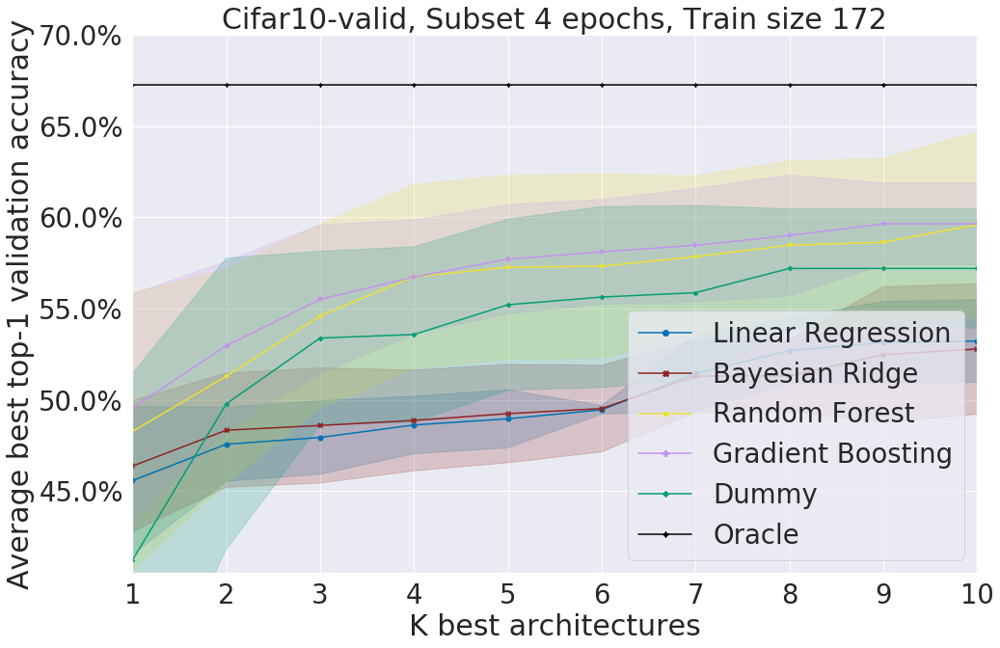

In [20]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole.loc[df_whole['Model'].isin(selected_models)], x="K", y="True_Val_Acc", hue="Model", 
             style="Model", markers=True, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Cifar10-valid, Subset 4 epochs, Train size 172")
ax.set_ylim([40.50, 70.00])
ax.set_xlim([1, 10])
ax.set_ylabel("Average best top-1 validation accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in
           ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_cifar10valid_4epochs_n172_k10_top1_val_accs.pdf'), bbox_inches='tight')

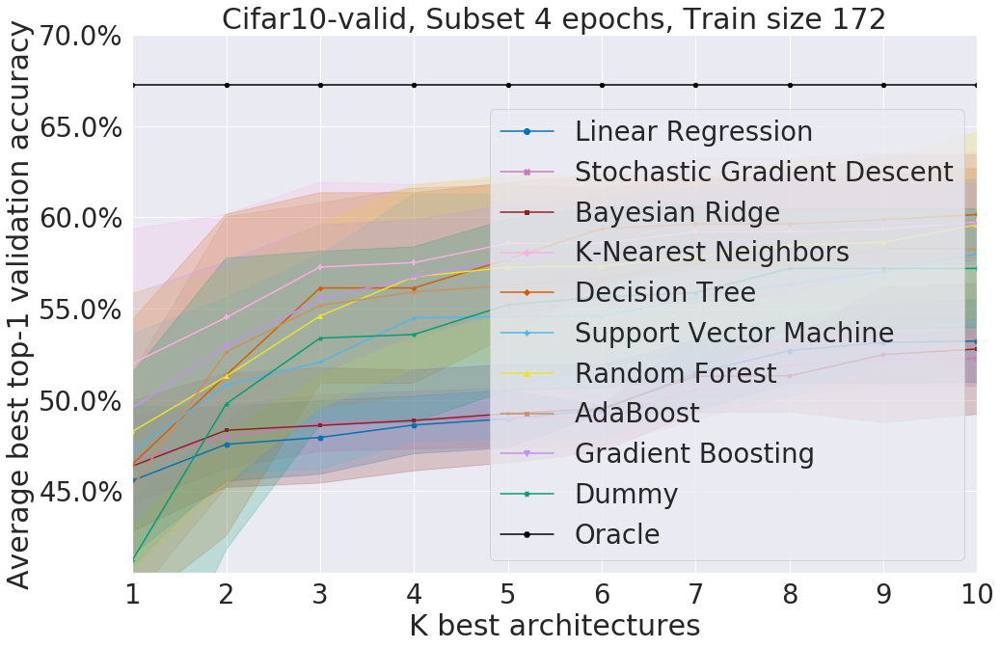

In [21]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole, x="K", y="True_Val_Acc", hue="Model", 
             style="Model", markers=True, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Cifar10-valid, Subset 4 epochs, Train size 172")
ax.set_ylim([40.50, 70.00])
ax.set_xlim([1, 10])
ax.set_ylabel("Average best top-1 validation accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_cifar10valid_4epochs_n172_k10_top1_val_accs_allmodels.pdf'), bbox_inches='tight')

## Selected Models (K100)

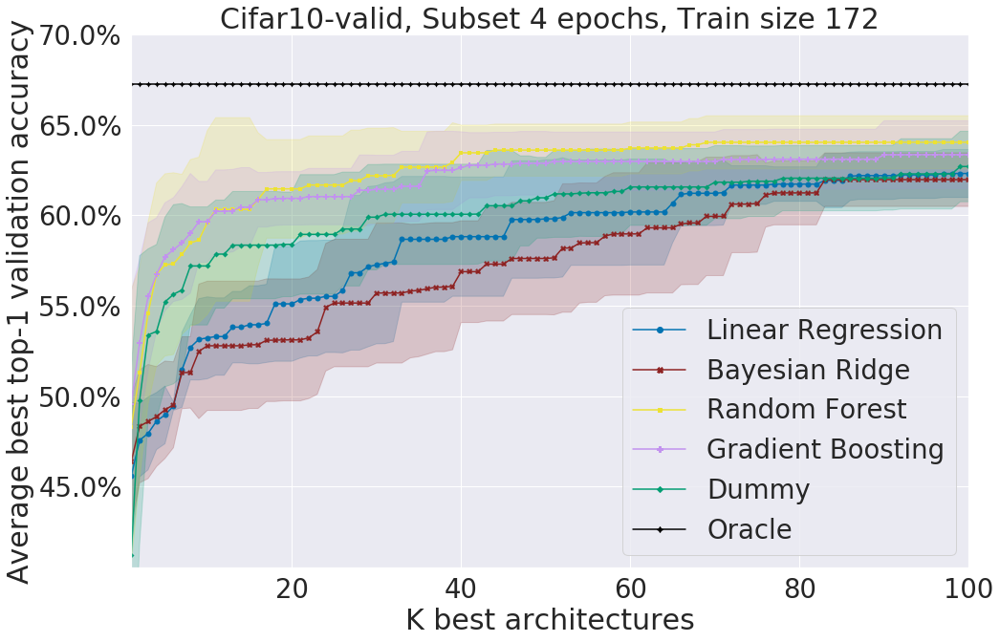

In [22]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole.loc[df_whole['Model'].isin(selected_models)], x="K", y="True_Val_Acc", hue="Model", 
             style="Model", markers=True, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Cifar10-valid, Subset 4 epochs, Train size 172")
ax.set_ylim([40.50, 70.00])
ax.set_xlim([1, 100])
ax.set_ylabel("Average best top-1 validation accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_cifar10valid_4epochs_n172_k100_top1_val_accs.pdf'), bbox_inches='tight')

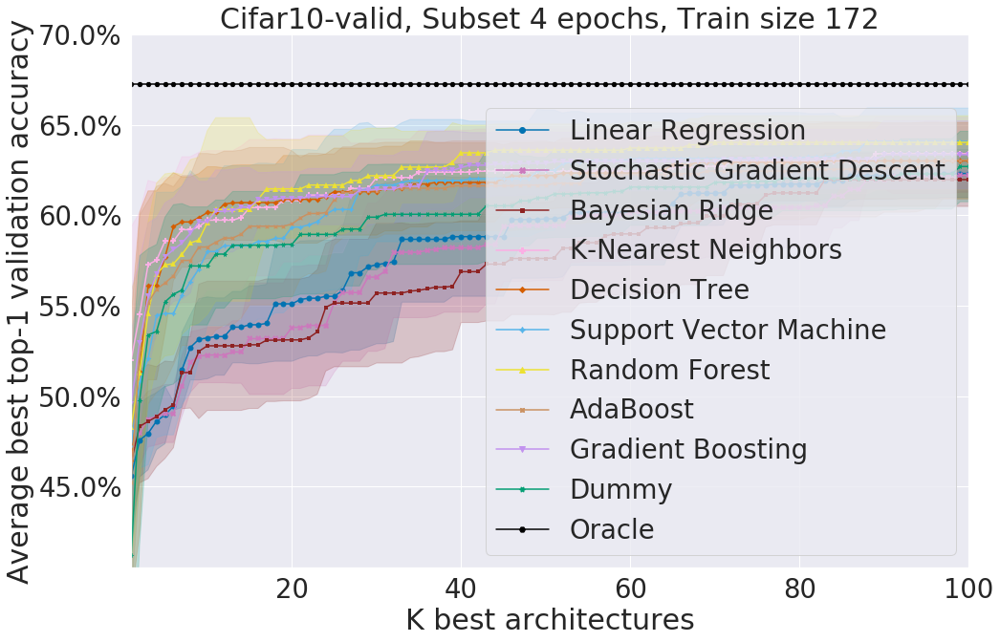

In [23]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole, x="K", y="True_Val_Acc", hue="Model", 
             style="Model", markers=True, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Cifar10-valid, Subset 4 epochs, Train size 172")
ax.set_ylim([40.50, 70.00])
ax.set_xlim([1, 100])
ax.set_ylabel("Average best top-1 validation accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_cifar10valid_4epochs_n172_k100_top1_val_accs_allmodels.pdf'), bbox_inches='tight')

## Selected Models (K1000) WITHOUT MARKERS

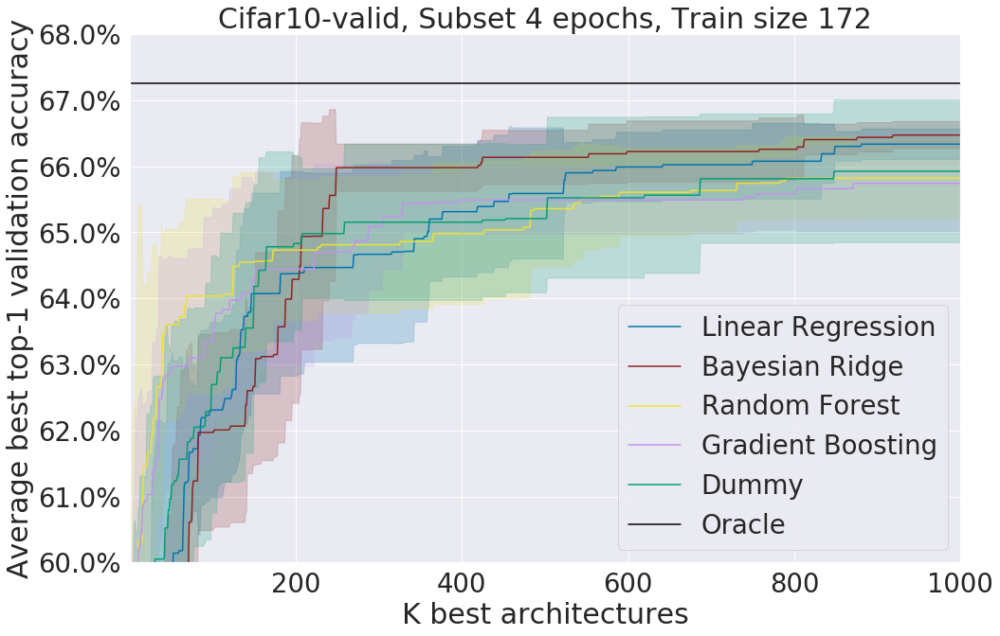

In [24]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole.loc[df_whole['Model'].isin(selected_models)], x="K", y="True_Val_Acc", hue="Model", 
             style="Model", markers=False, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Cifar10-valid, Subset 4 epochs, Train size 172")
ax.set_ylim([60.00, 68.00])
ax.set_xlim([1, 1000])
ax.set_ylabel("Average best top-1 validation accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_cifar10valid_4epochs_n172_k1000_top1_val_accs.pdf'), bbox_inches='tight')

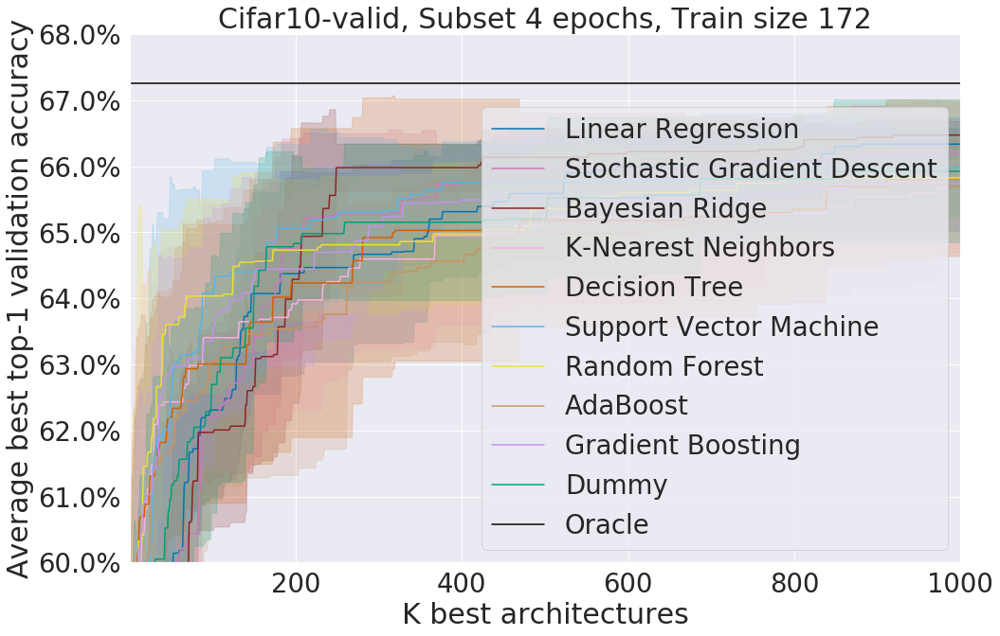

In [25]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole, x="K", y="True_Val_Acc", hue="Model", 
             style="Model", markers=False, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Cifar10-valid, Subset 4 epochs, Train size 172")
ax.set_ylim([60.00, 68.00])
ax.set_xlim([1, 1000])
ax.set_ylabel("Average best top-1 validation accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_cifar10valid_4epochs_n172_k1000_top1_val_accs_allmodels.pdf'), bbox_inches='tight')

## Selected Models (K1000) - Zoom In With Markers

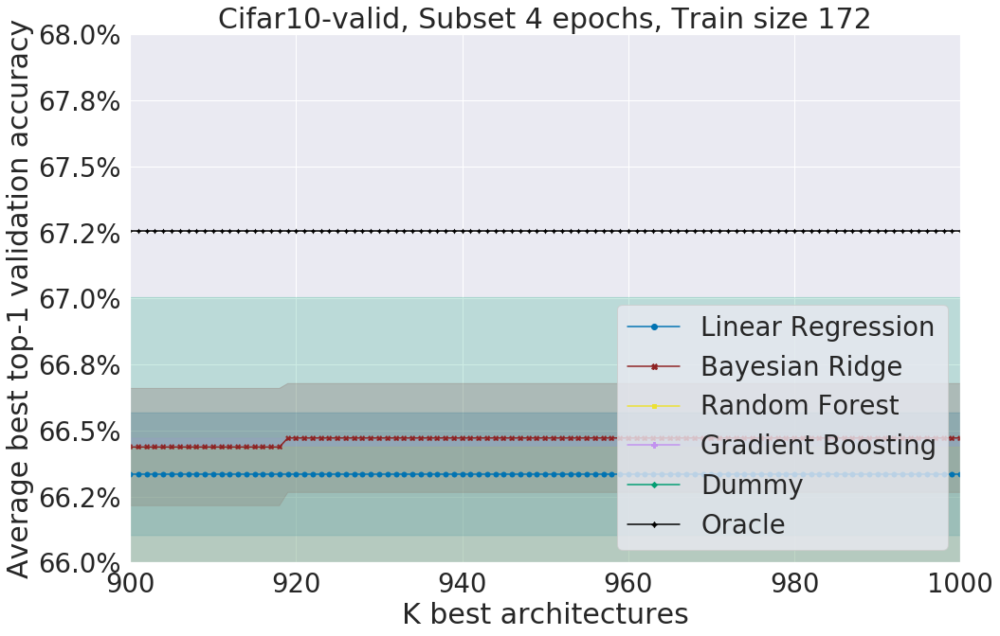

In [26]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole.loc[df_whole['Model'].isin(selected_models)], x="K", y="True_Val_Acc", hue="Model", 
             style="Model", markers=True, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Cifar10-valid, Subset 4 epochs, Train size 172")
ax.set_ylim([66.00, 68.00])
ax.set_xlim([900, 1000])
ax.set_ylabel("Average best top-1 validation accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_cifar10valid_4epochs_n172_k1000_top1_val_accs_zoom.pdf'), bbox_inches='tight')

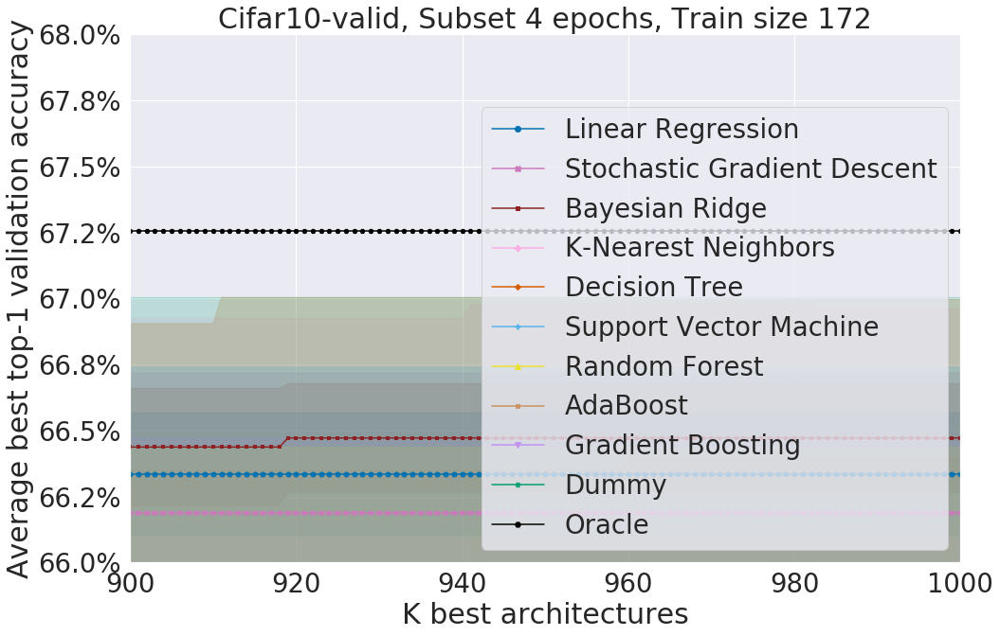

In [27]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole, x="K", y="True_Val_Acc", hue="Model", 
             style="Model", markers=True, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Cifar10-valid, Subset 4 epochs, Train size 172")
ax.set_ylim([66.00, 68.00])
ax.set_xlim([900, 1000])
ax.set_ylabel("Average best top-1 validation accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_cifar10valid_4epochs_n172_k1000_top1_val_accs_zoom_allmodels.pdf'), bbox_inches='tight')

# Subset 108

In [28]:
df_oracle = pd.read_csv("/home/gean/nns_performance_prediction/results/oracle/nasbench201_cifar10valid_108epochs_k5000_oracle.csv")
df_oracle

,Dataset,Epoch,Model,K,True_Val_Acc,True_Test_Acc,Best_Test_Acc
0,cifar10valid,108,Oracle,1,87.968,NaN,NaN
1,cifar10valid,108,Oracle,2,87.968,NaN,NaN
2,cifar10valid,108,Oracle,3,87.968,NaN,NaN
3,cifar10valid,108,Oracle,4,87.968,NaN,NaN
4,cifar10valid,108,Oracle,5,87.968,NaN,NaN
...,...,...,...,...,...,...,...
4995,cifar10valid,108,Oracle,4996,87.968,NaN,NaN
4996,cifar10valid,108,Oracle,4997,87.968,NaN,NaN
4997,cifar10valid,108,Oracle,4998,87.968,NaN,NaN
4998,cifar10valid,108,Oracle,4999,87.968,NaN,NaN


In [29]:
df_whole = pd.read_csv("/home/gean/nns_performance_prediction/results/fast/test12/nasbench201_cifar10valid_108epochs_n172_k5000_top1_val_test_accs.csv")
df_whole

,Dataset,Epoch,Train_Size,Seed,Model,K,True_Val_Acc,True_Test_Acc
0,cifar10valid,108,172,0,LinearRegression,1,81.936,NaN
1,cifar10valid,108,172,0,LinearRegression,2,83.084,NaN
2,cifar10valid,108,172,0,LinearRegression,3,83.084,NaN
3,cifar10valid,108,172,0,LinearRegression,4,83.084,NaN
4,cifar10valid,108,172,0,LinearRegression,5,83.084,NaN
...,...,...,...,...,...,...,...,...
549995,cifar10valid,108,172,12345,DummyRegressor,4996,87.968,NaN
549996,cifar10valid,108,172,12345,DummyRegressor,4997,87.968,NaN
549997,cifar10valid,108,172,12345,DummyRegressor,4998,87.968,NaN
549998,cifar10valid,108,172,12345,DummyRegressor,4999,87.968,NaN


In [30]:
df_whole = df_whole.loc[df_whole['Model'] != 'Lasso']

In [31]:
df_whole = df_whole.append(df_oracle)

df_whole['Model'].replace({'LinearRegression': 'Linear Regression', 
                           'DecisionTreeRegressor': 'Decision Tree', 'SGDRegressor': 'Stochastic Gradient Descent', 
                           'MLPRegressor': 'Feedforward Neural Network', 'BayesianRidge': 'Bayesian Ridge',
                           'KNeighborsRegressor': 'K-Nearest Neighbors', 'SVR': 'Support Vector Machine',
                           'AdaBoostRegressor': 'AdaBoost', 'GradientBoostingRegressor': 'Gradient Boosting',
                           'RandomForestRegressor': 'Random Forest', 'DummyRegressor': 'Dummy',  
                           'GCN_Complete': 'Graph Convolutional Network'}, inplace=True)
df_whole

,Dataset,Epoch,Train_Size,Seed,Model,K,True_Val_Acc,True_Test_Acc,Best_Test_Acc
0,cifar10valid,108,172.0,0.0,Linear Regression,1,81.936,NaN,NaN
1,cifar10valid,108,172.0,0.0,Linear Regression,2,83.084,NaN,NaN
2,cifar10valid,108,172.0,0.0,Linear Regression,3,83.084,NaN,NaN
3,cifar10valid,108,172.0,0.0,Linear Regression,4,83.084,NaN,NaN
4,cifar10valid,108,172.0,0.0,Linear Regression,5,83.084,NaN,NaN
...,...,...,...,...,...,...,...,...,...
4995,cifar10valid,108,NaN,NaN,Oracle,4996,87.968,NaN,NaN
4996,cifar10valid,108,NaN,NaN,Oracle,4997,87.968,NaN,NaN
4997,cifar10valid,108,NaN,NaN,Oracle,4998,87.968,NaN,NaN
4998,cifar10valid,108,NaN,NaN,Oracle,4999,87.968,NaN,NaN


## Selected Models (K10)

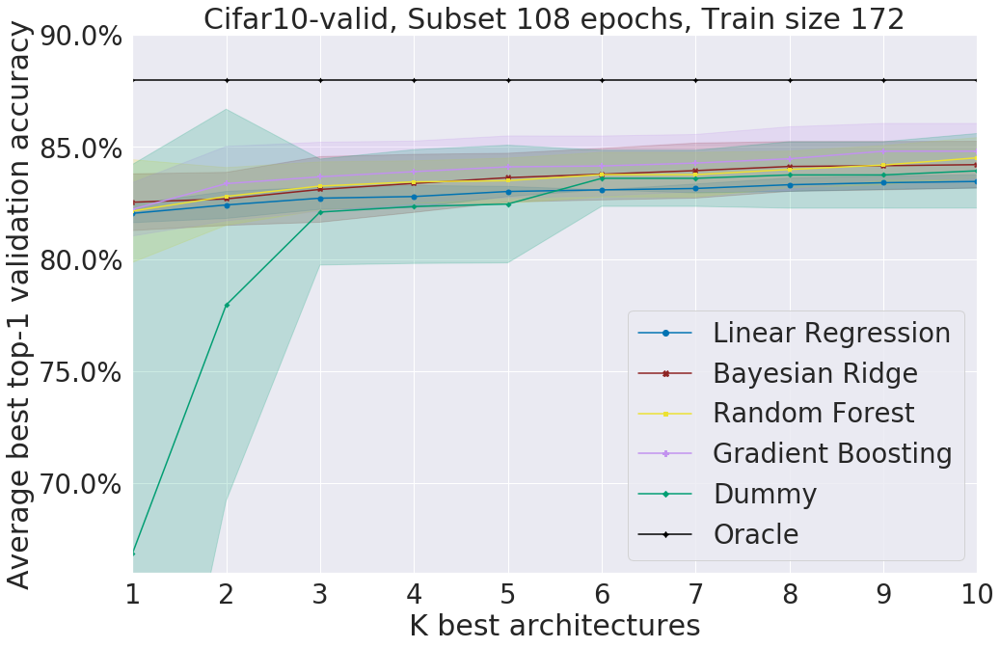

In [32]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole.loc[df_whole['Model'].isin(selected_models)], x="K", y="True_Val_Acc", hue="Model", 
             style="Model", markers=True, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Cifar10-valid, Subset 108 epochs, Train size 172")
ax.set_ylim([66.00, 90.00])
ax.set_xlim([1, 10])
ax.set_ylabel("Average best top-1 validation accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_cifar10valid_108epochs_n172_k10_top1_val_accs.pdf'), 
            bbox_inches='tight')

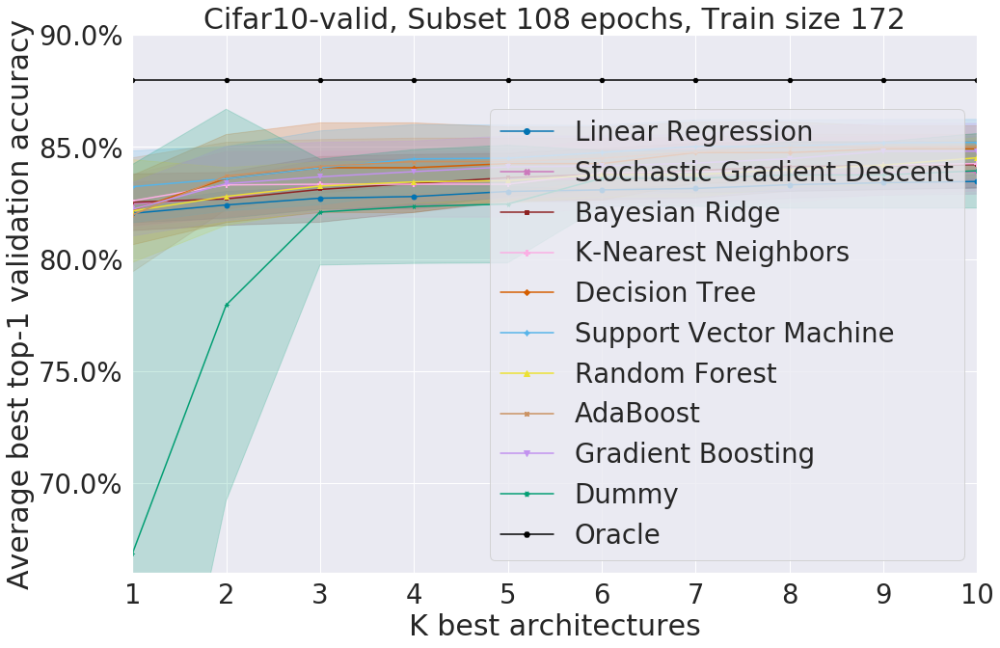

In [33]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole, x="K", y="True_Val_Acc", hue="Model", 
             style="Model", markers=True, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Cifar10-valid, Subset 108 epochs, Train size 172")
ax.set_ylim([66.00, 90.00])
ax.set_xlim([1, 10])
ax.set_ylabel("Average best top-1 validation accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_cifar10valid_108epochs_n172_k10_top1_val_accs_allmodels.pdf'), 
            bbox_inches='tight')

## Selected Models (K100)

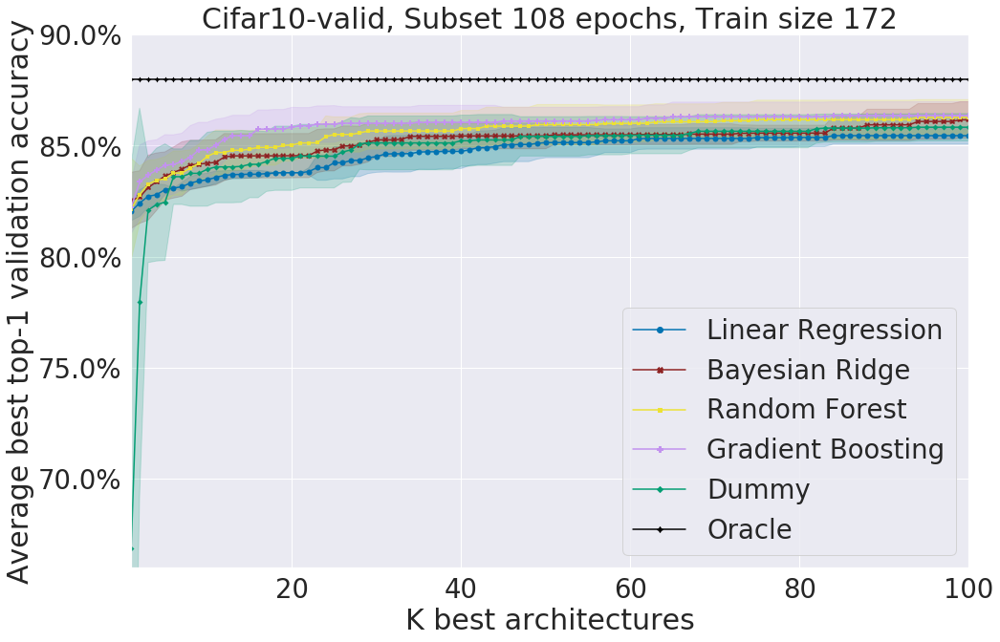

In [34]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole.loc[df_whole['Model'].isin(selected_models)], x="K", y="True_Val_Acc", hue="Model", 
             style="Model", markers=True, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Cifar10-valid, Subset 108 epochs, Train size 172")
ax.set_ylim([66.00, 90.00])
ax.set_xlim([1, 100])
ax.set_ylabel("Average best top-1 validation accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_cifar10valid_108epochs_n172_k100_top1_val_accs.pdf'), 
            bbox_inches='tight')

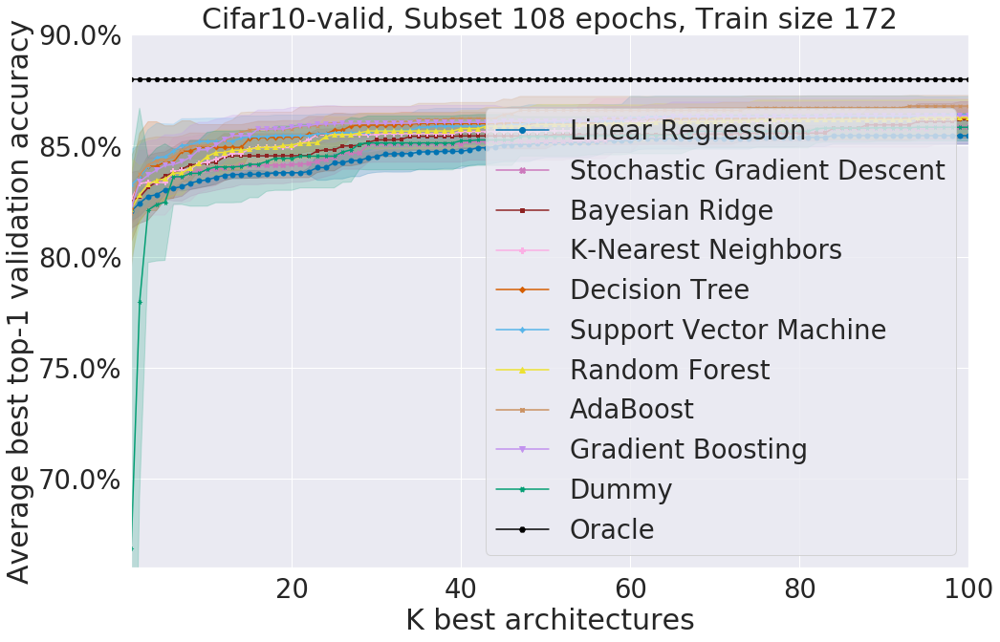

In [35]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole, x="K", y="True_Val_Acc", hue="Model", 
             style="Model", markers=True, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Cifar10-valid, Subset 108 epochs, Train size 172")
ax.set_ylim([66.00, 90.00])
ax.set_xlim([1, 100])
ax.set_ylabel("Average best top-1 validation accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_cifar10valid_108epochs_n172_k100_top1_val_accs_allmodels.pdf'), 
            bbox_inches='tight')

## Selected Models (K1000) WITHOUT MARKERS

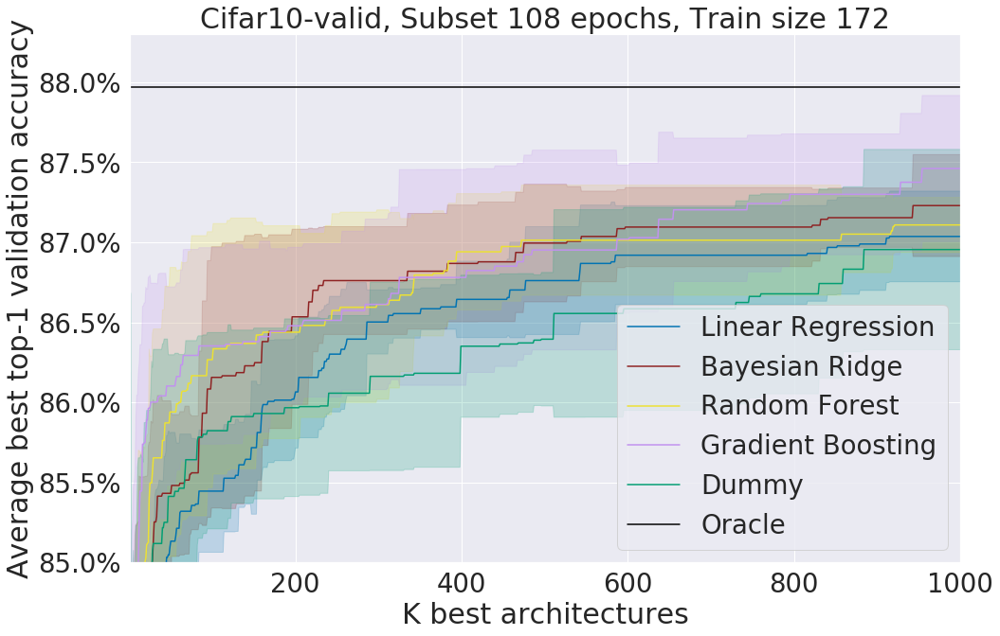

In [36]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole.loc[df_whole['Model'].isin(selected_models)], x="K", y="True_Val_Acc", hue="Model", 
             style="Model", markers=False, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Cifar10-valid, Subset 108 epochs, Train size 172")
ax.set_ylim([85.00, 88.30])
ax.set_xlim([1, 1000])
ax.set_ylabel("Average best top-1 validation accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_cifar10valid_108epochs_n172_k1000_top1_val_accs.pdf'), 
            bbox_inches='tight')

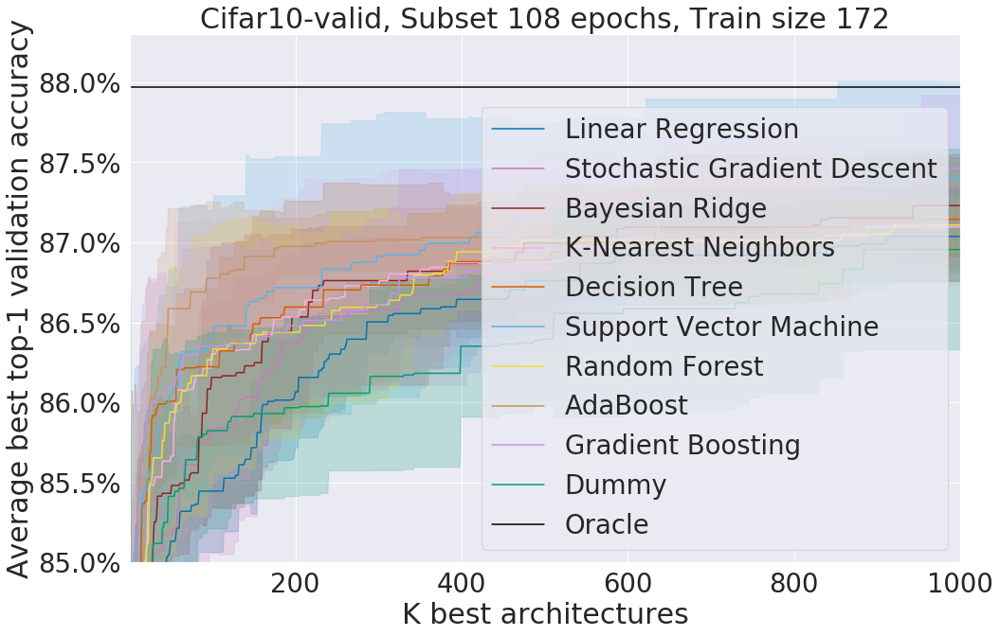

In [37]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole, x="K", y="True_Val_Acc", hue="Model", 
             style="Model", markers=False, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Cifar10-valid, Subset 108 epochs, Train size 172")
ax.set_ylim([85.00, 88.30])
ax.set_xlim([1, 1000])
ax.set_ylabel("Average best top-1 validation accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_cifar10valid_108epochs_n172_k1000_top1_val_accs_allmodels.pdf'), 
            bbox_inches='tight')

## Selected Models (K1000) - Zoom In With Markers

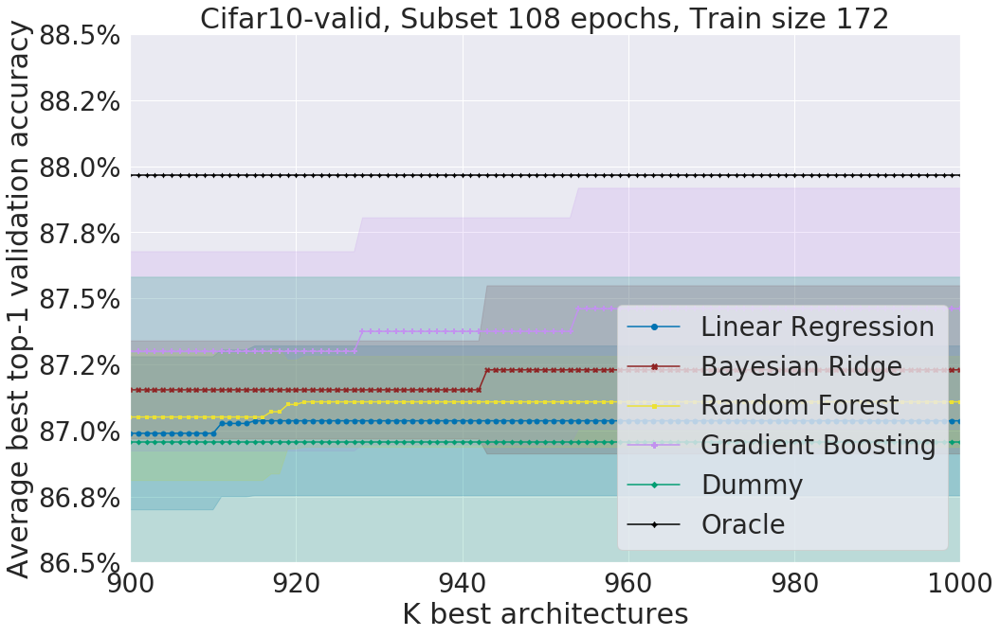

In [38]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole.loc[df_whole['Model'].isin(selected_models)], x="K", y="True_Val_Acc", hue="Model", 
             style="Model", markers=True, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Cifar10-valid, Subset 108 epochs, Train size 172")
ax.set_ylim([86.50, 88.50])
ax.set_xlim([900, 1000])
ax.set_ylabel("Average best top-1 validation accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_cifar10valid_108epochs_n172_k1000_top1_val_accs_zoom.pdf'), 
            bbox_inches='tight')

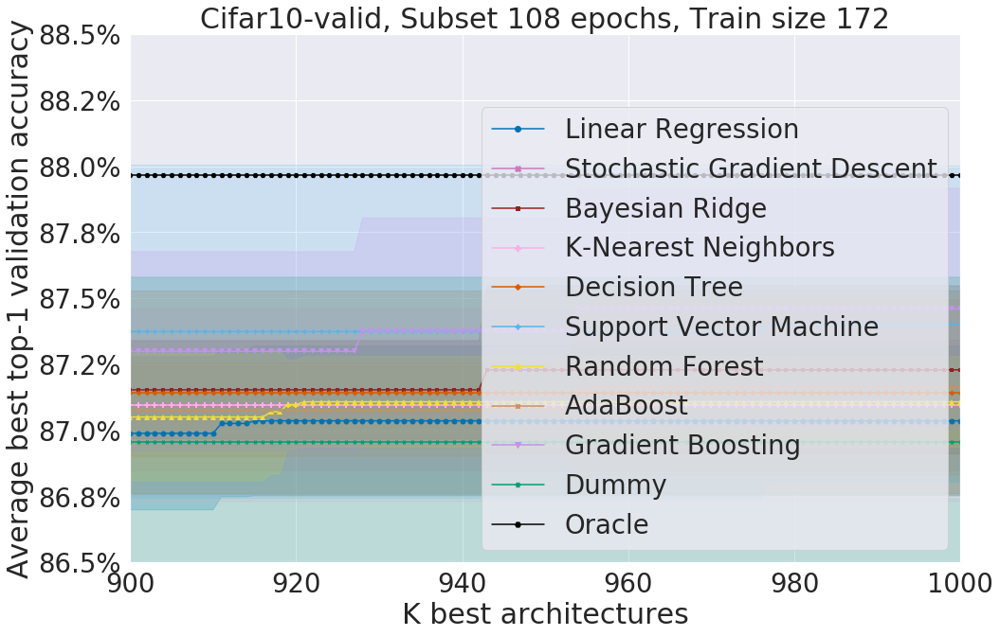

In [39]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole, x="K", y="True_Val_Acc", hue="Model", 
             style="Model", markers=True, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Cifar10-valid, Subset 108 epochs, Train size 172")
ax.set_ylim([86.50, 88.50])
ax.set_xlim([900, 1000])
ax.set_ylabel("Average best top-1 validation accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_cifar10valid_108epochs_n172_k1000_top1_val_accs_zoom_allmodels.pdf'), 
            bbox_inches='tight')

# Subset 200

In [40]:
df_oracle = pd.read_csv("/home/gean/nns_performance_prediction/results/oracle/nasbench201_cifar10valid_200epochs_k5000_oracle.csv")
df_oracle

,Dataset,Epoch,Model,K,True_Val_Acc,True_Test_Acc,Best_Test_Acc
0,cifar10valid,200,Oracle,1,91.606667,91.09,91.523333
1,cifar10valid,200,Oracle,2,91.606667,91.09,91.523333
2,cifar10valid,200,Oracle,3,91.606667,91.09,91.523333
3,cifar10valid,200,Oracle,4,91.606667,91.09,91.523333
4,cifar10valid,200,Oracle,5,91.606667,91.09,91.523333
...,...,...,...,...,...,...,...
4995,cifar10valid,200,Oracle,4996,91.606667,91.09,91.523333
4996,cifar10valid,200,Oracle,4997,91.606667,91.09,91.523333
4997,cifar10valid,200,Oracle,4998,91.606667,91.09,91.523333
4998,cifar10valid,200,Oracle,4999,91.606667,91.09,91.523333


In [41]:
df_whole = pd.read_csv("/home/gean/nns_performance_prediction/results/fast/test12/nasbench201_cifar10valid_200epochs_n172_k5000_top1_val_test_accs.csv")
df_whole

,Dataset,Epoch,Train_Size,Seed,Model,K,True_Val_Acc,True_Test_Acc
0,cifar10valid,200,172,0,LinearRegression,1,89.044000,88.960000
1,cifar10valid,200,172,0,LinearRegression,2,89.305333,88.960000
2,cifar10valid,200,172,0,LinearRegression,3,89.305333,88.960000
3,cifar10valid,200,172,0,LinearRegression,4,89.570667,89.286667
4,cifar10valid,200,172,0,LinearRegression,5,89.570667,89.286667
...,...,...,...,...,...,...,...,...
549995,cifar10valid,200,172,12345,DummyRegressor,4996,91.568000,91.310000
549996,cifar10valid,200,172,12345,DummyRegressor,4997,91.568000,91.310000
549997,cifar10valid,200,172,12345,DummyRegressor,4998,91.568000,91.310000
549998,cifar10valid,200,172,12345,DummyRegressor,4999,91.568000,91.310000


In [42]:
df_whole = df_whole.loc[df_whole['Model'] != 'Lasso']

In [43]:
df_whole = df_whole.append(df_oracle)

df_whole['Model'].replace({'LinearRegression': 'Linear Regression', 
                           'DecisionTreeRegressor': 'Decision Tree', 'SGDRegressor': 'Stochastic Gradient Descent', 
                           'MLPRegressor': 'Feedforward Neural Network', 'BayesianRidge': 'Bayesian Ridge',
                           'KNeighborsRegressor': 'K-Nearest Neighbors', 'SVR': 'Support Vector Machine',
                           'AdaBoostRegressor': 'AdaBoost', 'GradientBoostingRegressor': 'Gradient Boosting',
                           'RandomForestRegressor': 'Random Forest', 'DummyRegressor': 'Dummy',  
                           'GCN_Complete': 'Graph Convolutional Network'}, inplace=True)
df_whole

,Dataset,Epoch,Train_Size,Seed,Model,K,True_Val_Acc,True_Test_Acc,Best_Test_Acc
0,cifar10valid,200,172.0,0.0,Linear Regression,1,89.044000,88.960000,NaN
1,cifar10valid,200,172.0,0.0,Linear Regression,2,89.305333,88.960000,NaN
2,cifar10valid,200,172.0,0.0,Linear Regression,3,89.305333,88.960000,NaN
3,cifar10valid,200,172.0,0.0,Linear Regression,4,89.570667,89.286667,NaN
4,cifar10valid,200,172.0,0.0,Linear Regression,5,89.570667,89.286667,NaN
...,...,...,...,...,...,...,...,...,...
4995,cifar10valid,200,NaN,NaN,Oracle,4996,91.606667,91.090000,91.523333
4996,cifar10valid,200,NaN,NaN,Oracle,4997,91.606667,91.090000,91.523333
4997,cifar10valid,200,NaN,NaN,Oracle,4998,91.606667,91.090000,91.523333
4998,cifar10valid,200,NaN,NaN,Oracle,4999,91.606667,91.090000,91.523333


## Selected Models (K10)

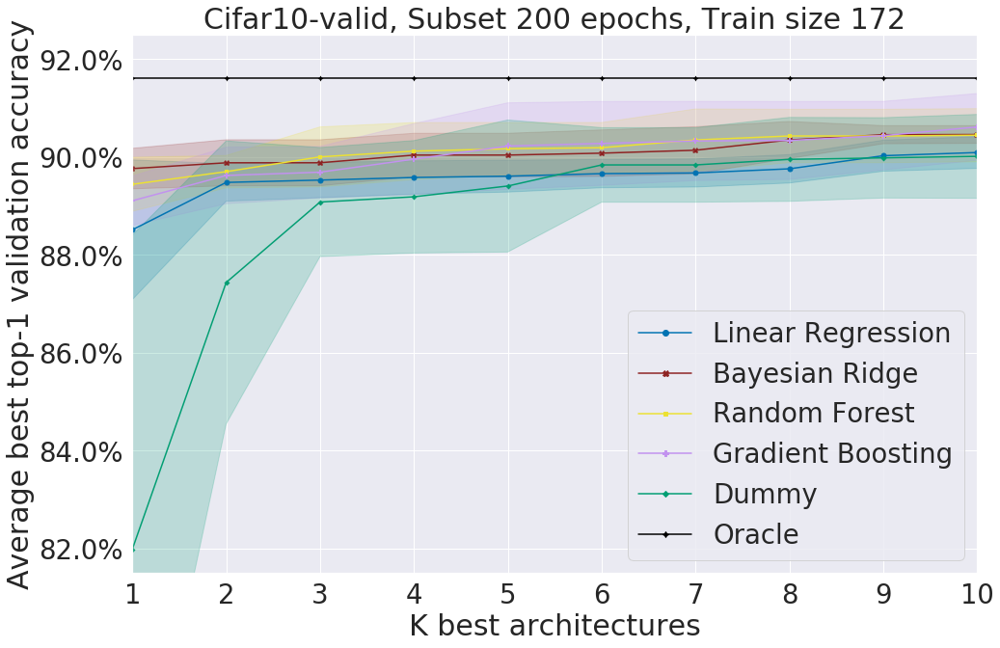

In [44]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole.loc[df_whole['Model'].isin(selected_models)], x="K", y="True_Val_Acc", hue="Model", 
             style="Model", markers=True, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Cifar10-valid, Subset 200 epochs, Train size 172")
ax.set_ylim([81.50, 92.50])
ax.set_xlim([1, 10])
ax.set_ylabel("Average best top-1 validation accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_cifar10valid_200epochs_n172_k10_top1_val_accs.pdf'), 
            bbox_inches='tight')

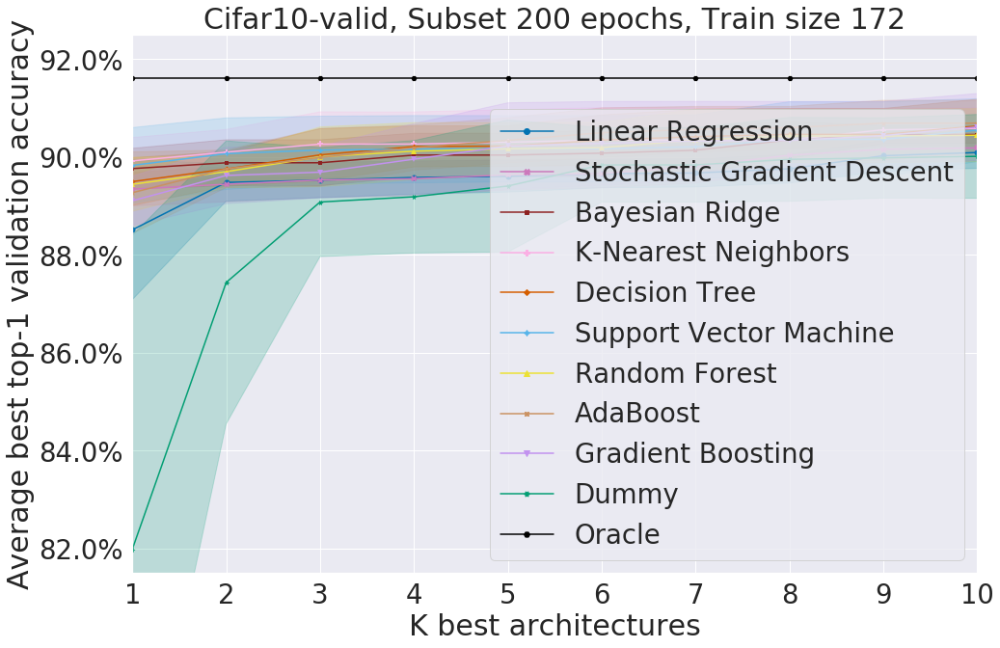

In [45]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole, x="K", y="True_Val_Acc", hue="Model", 
             style="Model", markers=True, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Cifar10-valid, Subset 200 epochs, Train size 172")
ax.set_ylim([81.50, 92.50])
ax.set_xlim([1, 10])
ax.set_ylabel("Average best top-1 validation accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_cifar10valid_200epochs_n172_k10_top1_val_accs_allmodels.pdf'), 
            bbox_inches='tight')

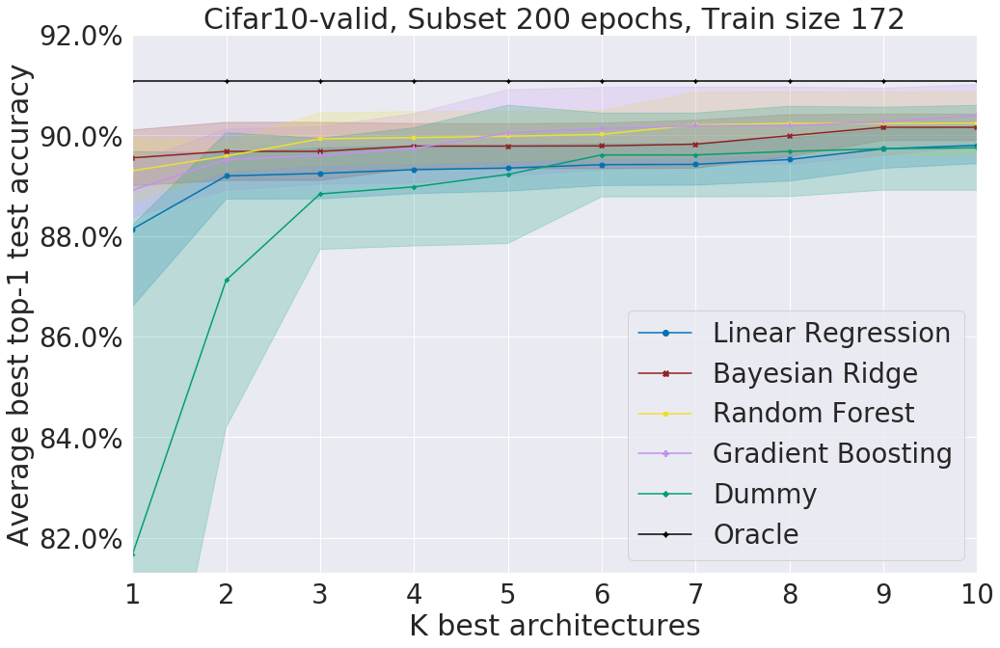

In [46]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole.loc[df_whole['Model'].isin(selected_models)], x="K", y="True_Test_Acc", hue="Model", 
             style="Model", markers=True, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Cifar10-valid, Subset 200 epochs, Train size 172")
ax.set_ylim([81.30, 92.00])
ax.set_xlim([1, 10])
ax.set_ylabel("Average best top-1 test accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_cifar10valid_200epochs_n172_k10_top1_test_accs.pdf'), 
            bbox_inches='tight')

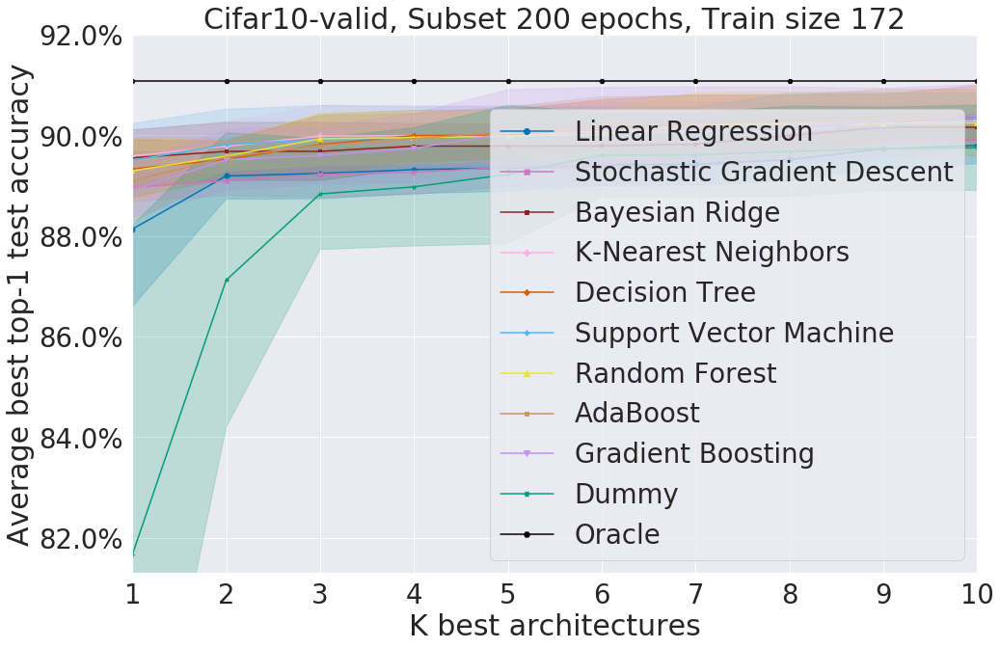

In [47]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole, x="K", y="True_Test_Acc", hue="Model", style="Model", markers=True, palette=palette, 
             markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Cifar10-valid, Subset 200 epochs, Train size 172")
ax.set_ylim([81.30, 92.00])
ax.set_xlim([1, 10])
ax.set_ylabel("Average best top-1 test accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_cifar10valid_200epochs_n172_k10_top1_test_accs_allmodels.pdf'), 
            bbox_inches='tight')

## Selected Models (K100)

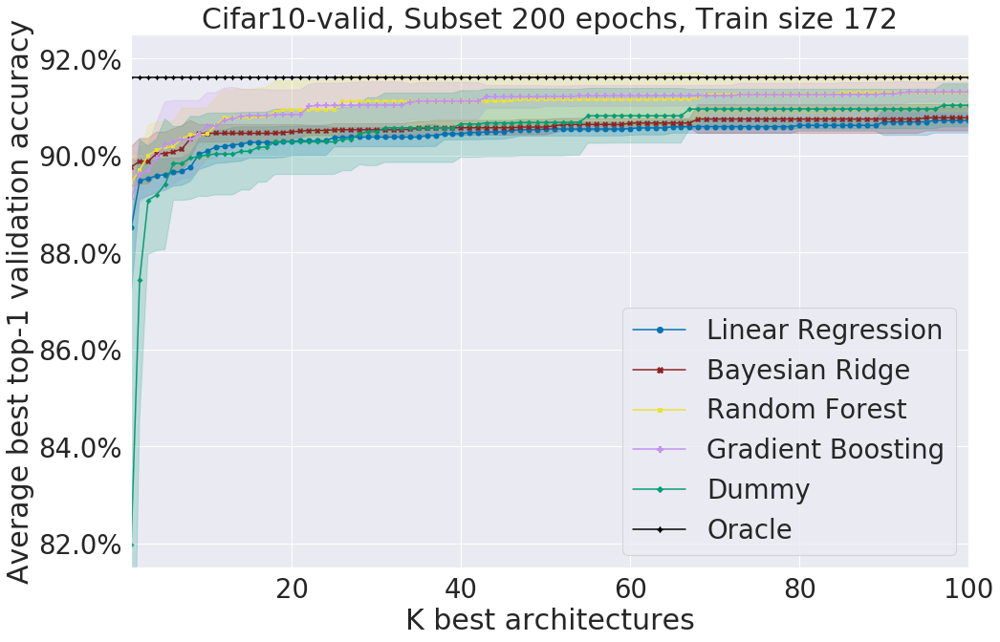

In [48]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole.loc[df_whole['Model'].isin(selected_models)], x="K", y="True_Val_Acc", hue="Model", 
             style="Model", markers=True, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Cifar10-valid, Subset 200 epochs, Train size 172")
ax.set_ylim([81.50, 92.50])
ax.set_xlim([1, 100])
ax.set_ylabel("Average best top-1 validation accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_cifar10valid_200epochs_n172_k100_top1_val_accs.pdf'), 
            bbox_inches='tight')

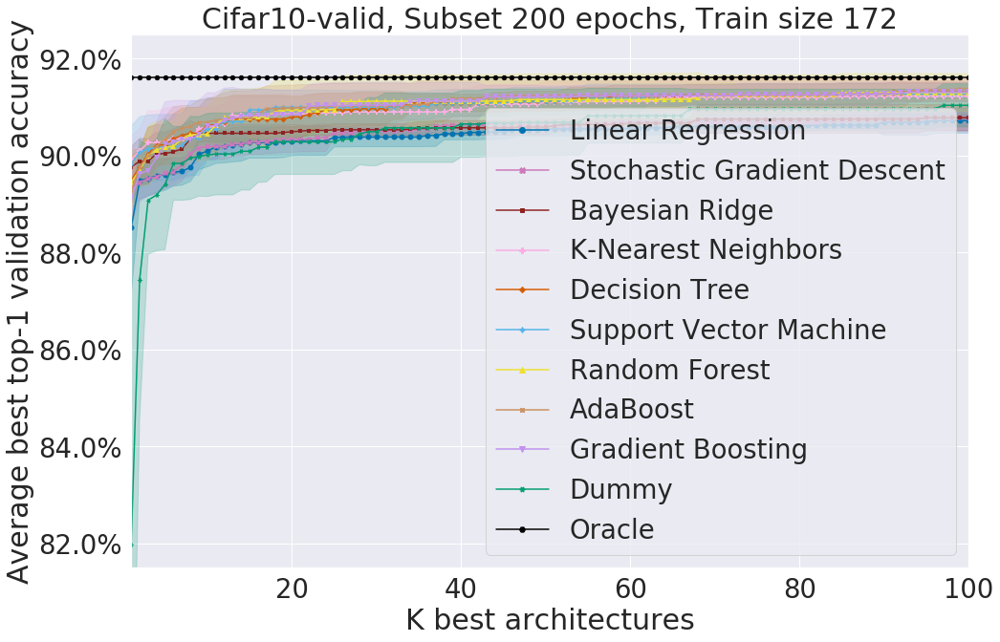

In [49]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole, x="K", y="True_Val_Acc", hue="Model", 
             style="Model", markers=True, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Cifar10-valid, Subset 200 epochs, Train size 172")
ax.set_ylim([81.50, 92.50])
ax.set_xlim([1, 100])
ax.set_ylabel("Average best top-1 validation accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_cifar10valid_200epochs_n172_k100_top1_val_accs_allmodels.pdf'), 
            bbox_inches='tight')

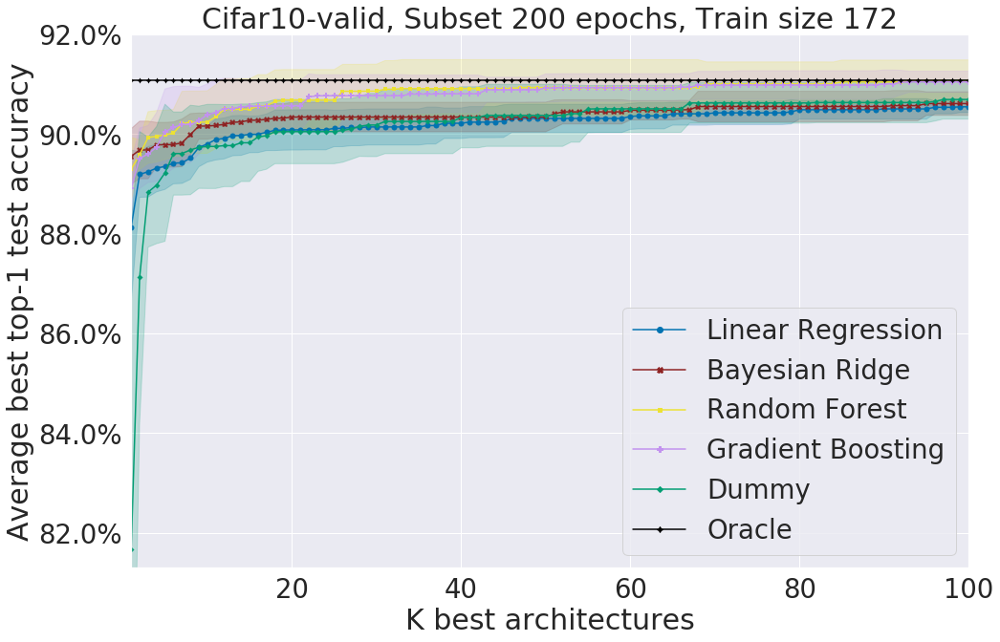

In [50]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole.loc[df_whole['Model'].isin(selected_models)], x="K", y="True_Test_Acc", hue="Model", 
             style="Model", markers=True, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Cifar10-valid, Subset 200 epochs, Train size 172")
ax.set_ylim([81.30, 92.00])
ax.set_xlim([1, 100])
ax.set_ylabel("Average best top-1 test accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_cifar10valid_200epochs_n172_k100_top1_test_accs.pdf'), 
            bbox_inches='tight')

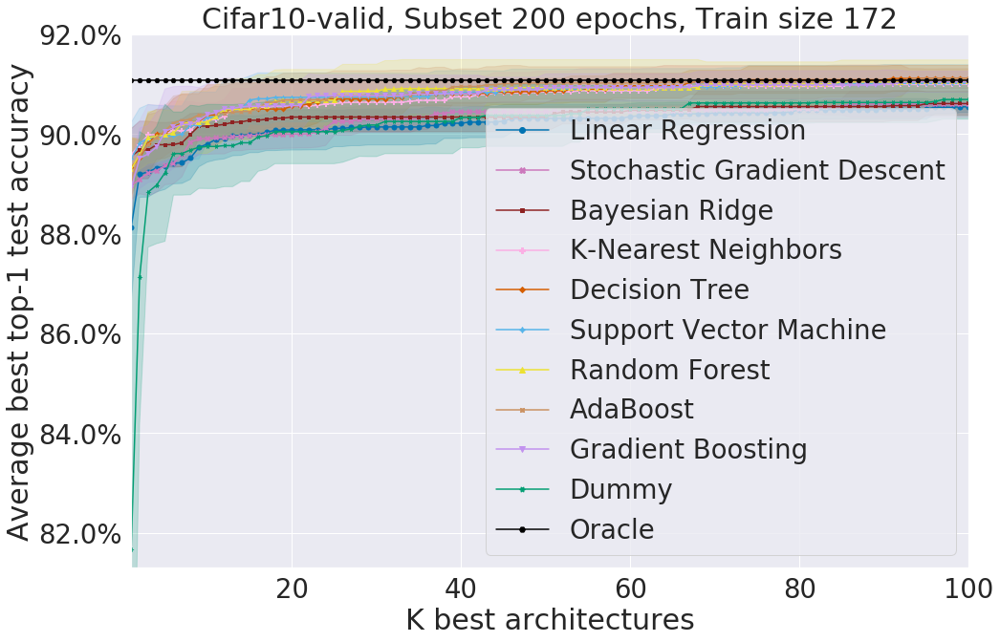

In [51]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole, x="K", y="True_Test_Acc", hue="Model", style="Model", markers=True, palette=palette, 
             markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Cifar10-valid, Subset 200 epochs, Train size 172")
ax.set_ylim([81.30, 92.00])
ax.set_xlim([1, 100])
ax.set_ylabel("Average best top-1 test accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_cifar10valid_200epochs_n172_k100_top1_test_accs_allmodels.pdf'), 
            bbox_inches='tight')

## Selected Models (K1000) WITHOUT MARKERS

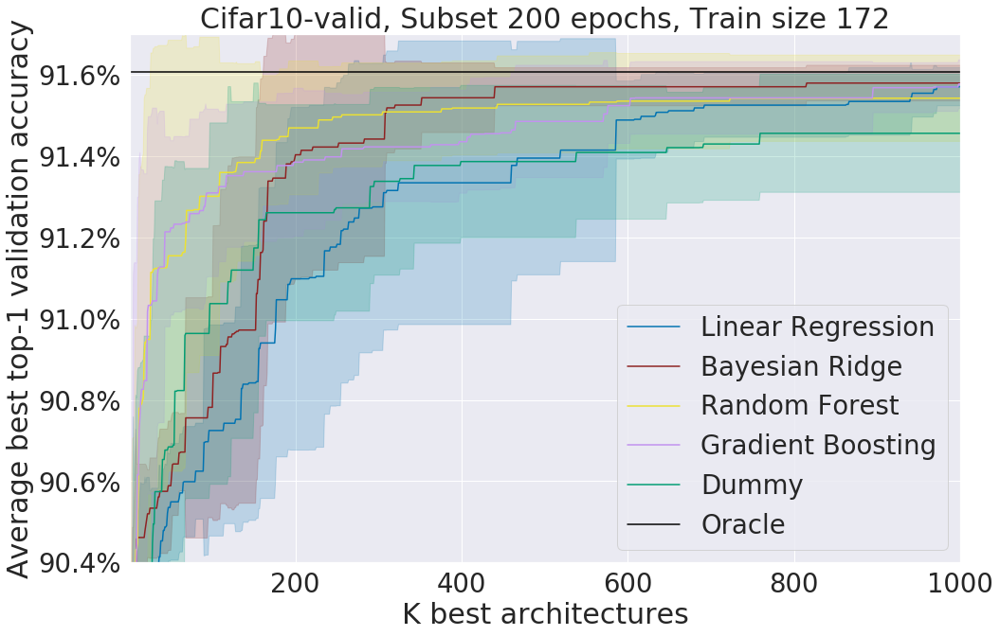

In [52]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole.loc[df_whole['Model'].isin(selected_models)], x="K", y="True_Val_Acc", hue="Model", 
             style="Model", markers=False, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Cifar10-valid, Subset 200 epochs, Train size 172")
ax.set_ylim([90.40, 91.70])
ax.set_xlim([1, 1000])
ax.set_ylabel("Average best top-1 validation accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_cifar10valid_200epochs_n172_k1000_top1_val_accs.pdf'), 
            bbox_inches='tight')

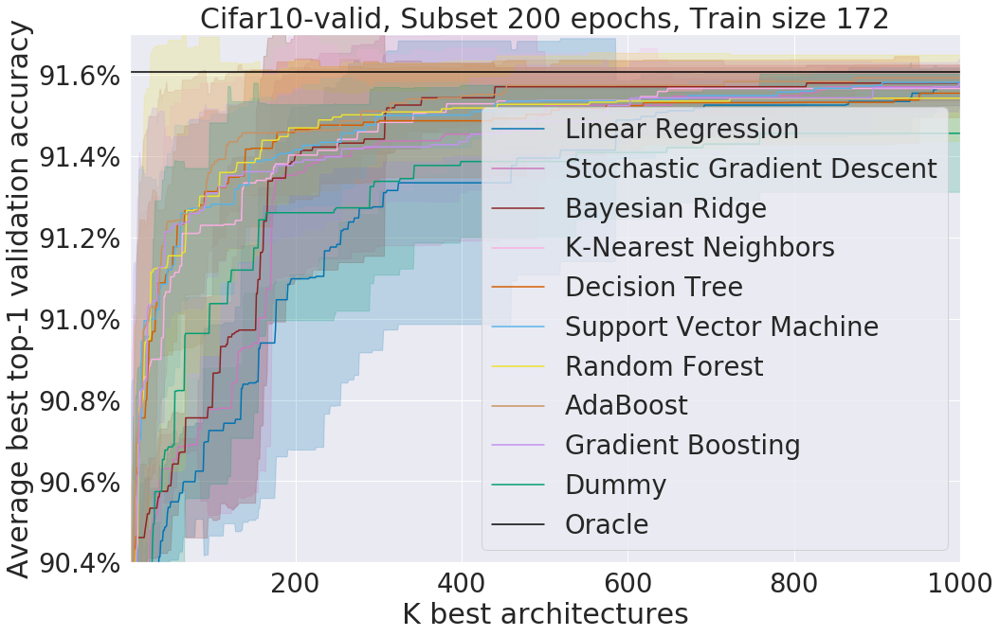

In [53]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole, x="K", y="True_Val_Acc", hue="Model", 
             style="Model", markers=False, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Cifar10-valid, Subset 200 epochs, Train size 172")
ax.set_ylim([90.40, 91.70])
ax.set_xlim([1, 1000])
ax.set_ylabel("Average best top-1 validation accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_cifar10valid_200epochs_n172_k1000_top1_val_accs_allmodels.pdf'), 
            bbox_inches='tight')

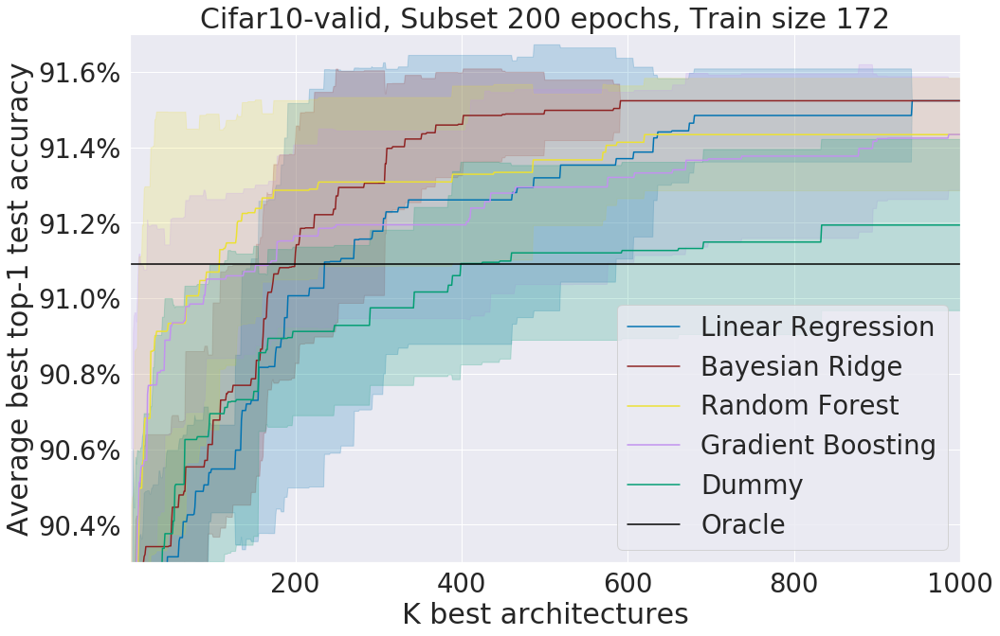

In [54]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole.loc[df_whole['Model'].isin(selected_models)], x="K", y="True_Test_Acc", hue="Model", 
             style="Model", markers=False, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Cifar10-valid, Subset 200 epochs, Train size 172")
ax.set_ylim([90.30, 91.70])
ax.set_xlim([1, 1000])
ax.set_ylabel("Average best top-1 test accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_cifar10valid_200epochs_n172_k1000_top1_test_accs.pdf'), 
            bbox_inches='tight')

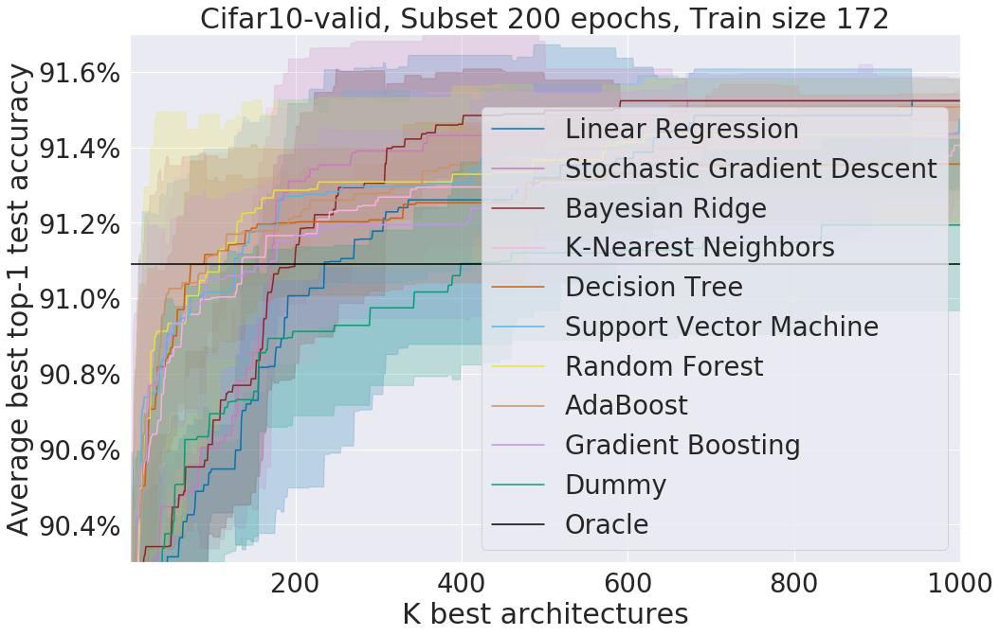

In [55]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole, x="K", y="True_Test_Acc", hue="Model", 
             style="Model", markers=False, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Cifar10-valid, Subset 200 epochs, Train size 172")
ax.set_ylim([90.30, 91.70])
ax.set_xlim([1, 1000])
ax.set_ylabel("Average best top-1 test accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_cifar10valid_200epochs_n172_k1000_top1_test_accs_allmodels.pdf'), 
            bbox_inches='tight')

## Selected Models (K1000) - Zoom In With Markers

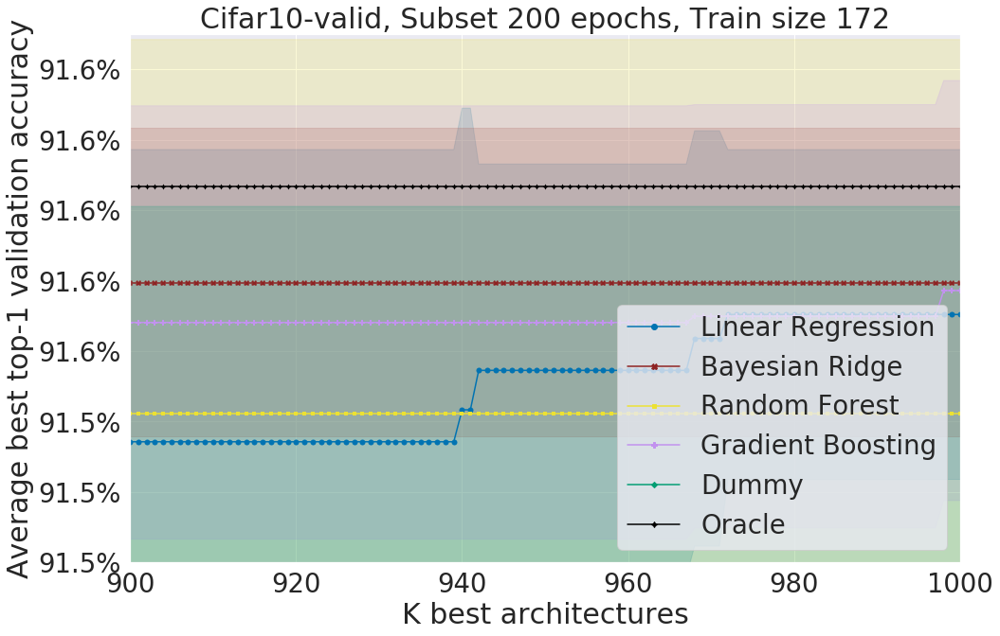

In [56]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole.loc[df_whole['Model'].isin(selected_models)], x="K", y="True_Val_Acc", hue="Model", 
             style="Model", markers=True, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Cifar10-valid, Subset 200 epochs, Train size 172")
ax.set_ylim([91.50, 91.65])
ax.set_xlim([900, 1000])
ax.set_ylabel("Average best top-1 validation accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_cifar10valid_200epochs_n172_k1000_top1_val_accs_zoom.pdf'), 
            bbox_inches='tight')

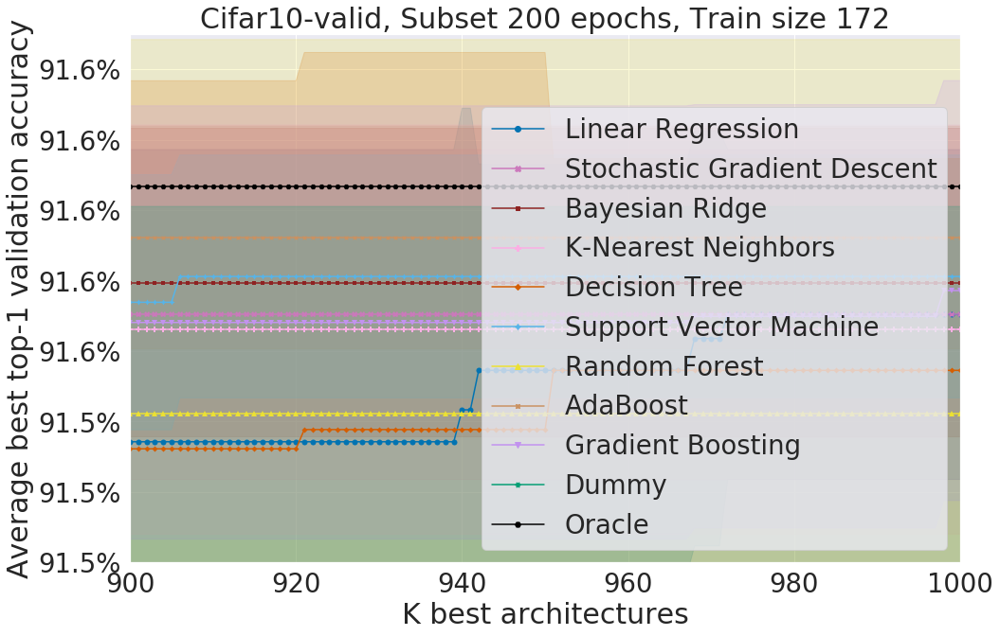

In [57]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole, x="K", y="True_Val_Acc", hue="Model", 
             style="Model", markers=True, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Cifar10-valid, Subset 200 epochs, Train size 172")
ax.set_ylim([91.50, 91.65])
ax.set_xlim([900, 1000])
ax.set_ylabel("Average best top-1 validation accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_cifar10valid_200epochs_n172_k1000_top1_val_accs_zoom_allmodels.pdf'), 
            bbox_inches='tight')

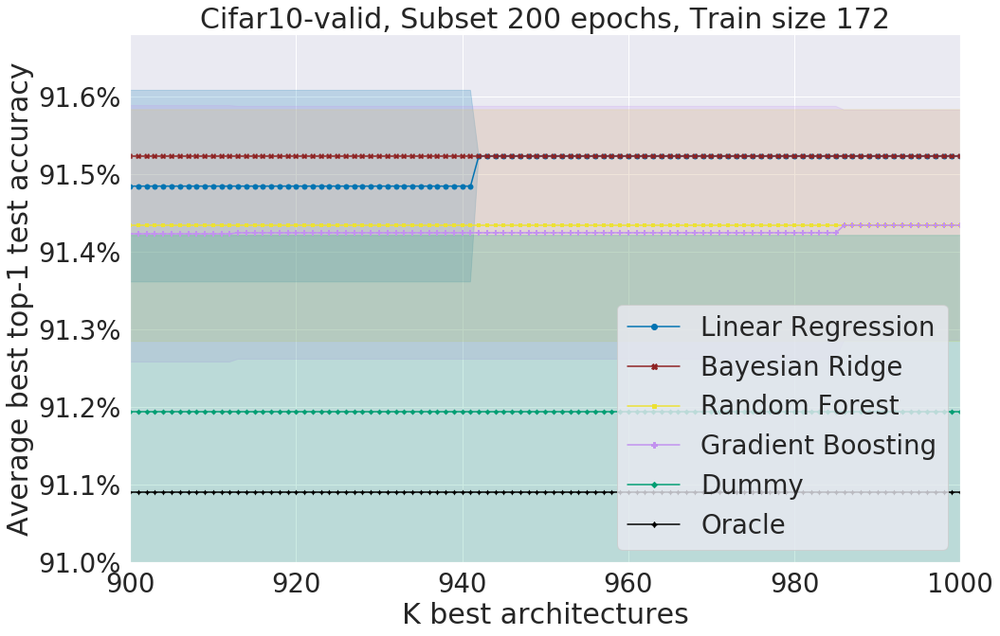

In [58]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole.loc[df_whole['Model'].isin(selected_models)], x="K", y="True_Test_Acc", hue="Model", 
             style="Model", markers=True, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Cifar10-valid, Subset 200 epochs, Train size 172")
ax.set_ylim([91.00, 91.68])
ax.set_xlim([900, 1000])
ax.set_ylabel("Average best top-1 test accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_cifar10valid_200epochs_n172_k1000_top1_test_accs_zoom.pdf'), 
            bbox_inches='tight')

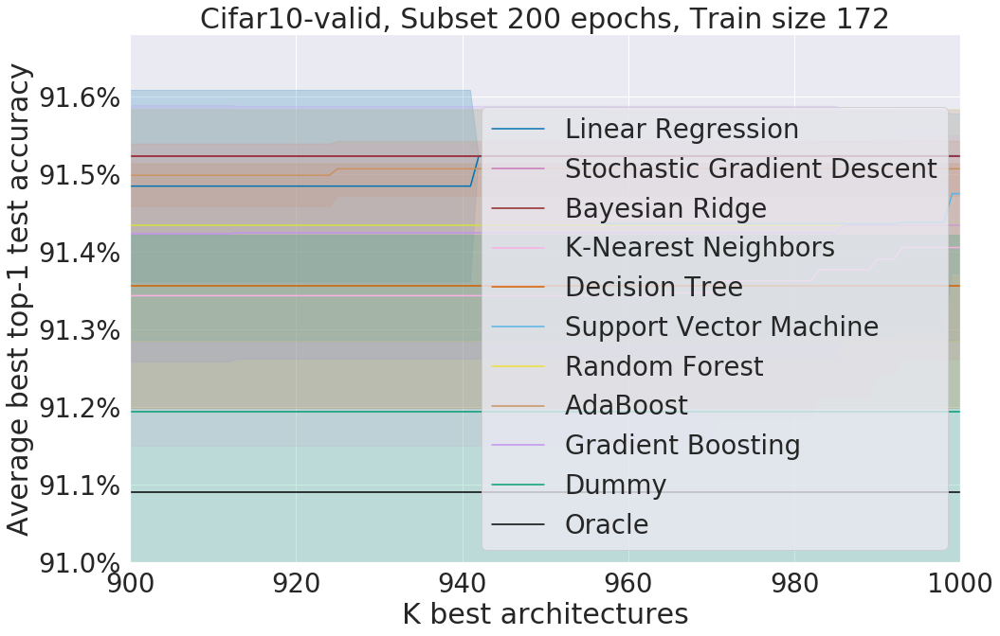

In [59]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole, x="K", y="True_Test_Acc", hue="Model", 
             style="Model", markers=False, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Cifar10-valid, Subset 200 epochs, Train size 172")
ax.set_ylim([91.00, 91.68])
ax.set_xlim([900, 1000])
ax.set_ylabel("Average best top-1 test accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_cifar10valid_200epochs_n172_k1000_top1_test_accs_zoom_allmodels.pdf'), 
            bbox_inches='tight')

# Cifar100

# Subset 200

In [60]:
df_oracle = pd.read_csv("/home/gean/nns_performance_prediction/results/oracle/nasbench201_cifar100_200epochs_k5000_oracle.csv")
df_oracle

,Dataset,Epoch,Model,K,True_Val_Acc,True_Test_Acc,Best_Test_Acc
0,cifar100,200,Oracle,1,73.493333,73.513333,73.513333
1,cifar100,200,Oracle,2,73.493333,73.513333,73.513333
2,cifar100,200,Oracle,3,73.493333,73.513333,73.513333
3,cifar100,200,Oracle,4,73.493333,73.513333,73.513333
4,cifar100,200,Oracle,5,73.493333,73.513333,73.513333
...,...,...,...,...,...,...,...
4995,cifar100,200,Oracle,4996,73.493333,73.513333,73.513333
4996,cifar100,200,Oracle,4997,73.493333,73.513333,73.513333
4997,cifar100,200,Oracle,4998,73.493333,73.513333,73.513333
4998,cifar100,200,Oracle,4999,73.493333,73.513333,73.513333


In [61]:
df_whole = pd.read_csv("/home/gean/nns_performance_prediction/results/fast/test12/nasbench201_cifar100_200epochs_n172_k5000_top1_val_test_accs.csv")
df_whole

,Dataset,Epoch,Train_Size,Seed,Model,K,True_Val_Acc,True_Test_Acc
0,cifar100,200,172,0,LinearRegression,1,69.780000,69.613333
1,cifar100,200,172,0,LinearRegression,2,69.780000,69.613333
2,cifar100,200,172,0,LinearRegression,3,69.780000,69.793333
3,cifar100,200,172,0,LinearRegression,4,70.760000,70.500000
4,cifar100,200,172,0,LinearRegression,5,70.760000,70.500000
...,...,...,...,...,...,...,...,...
549995,cifar100,200,172,12345,DummyRegressor,4996,73.086667,73.160000
549996,cifar100,200,172,12345,DummyRegressor,4997,73.086667,73.160000
549997,cifar100,200,172,12345,DummyRegressor,4998,73.086667,73.160000
549998,cifar100,200,172,12345,DummyRegressor,4999,73.086667,73.160000


In [62]:
df_whole = df_whole.loc[df_whole['Model'] != 'Lasso']

In [63]:
df_whole = df_whole.append(df_oracle)

df_whole['Model'].replace({'LinearRegression': 'Linear Regression', 
                           'DecisionTreeRegressor': 'Decision Tree', 'SGDRegressor': 'Stochastic Gradient Descent', 
                           'MLPRegressor': 'Feedforward Neural Network', 'BayesianRidge': 'Bayesian Ridge',
                           'KNeighborsRegressor': 'K-Nearest Neighbors', 'SVR': 'Support Vector Machine',
                           'AdaBoostRegressor': 'AdaBoost', 'GradientBoostingRegressor': 'Gradient Boosting',
                           'RandomForestRegressor': 'Random Forest', 'DummyRegressor': 'Dummy',  
                           'GCN_Complete': 'Graph Convolutional Network'}, inplace=True)
df_whole

,Dataset,Epoch,Train_Size,Seed,Model,K,True_Val_Acc,True_Test_Acc,Best_Test_Acc
0,cifar100,200,172.0,0.0,Linear Regression,1,69.780000,69.613333,NaN
1,cifar100,200,172.0,0.0,Linear Regression,2,69.780000,69.613333,NaN
2,cifar100,200,172.0,0.0,Linear Regression,3,69.780000,69.793333,NaN
3,cifar100,200,172.0,0.0,Linear Regression,4,70.760000,70.500000,NaN
4,cifar100,200,172.0,0.0,Linear Regression,5,70.760000,70.500000,NaN
...,...,...,...,...,...,...,...,...,...
4995,cifar100,200,NaN,NaN,Oracle,4996,73.493333,73.513333,73.513333
4996,cifar100,200,NaN,NaN,Oracle,4997,73.493333,73.513333,73.513333
4997,cifar100,200,NaN,NaN,Oracle,4998,73.493333,73.513333,73.513333
4998,cifar100,200,NaN,NaN,Oracle,4999,73.493333,73.513333,73.513333


## Selected Models (K10)

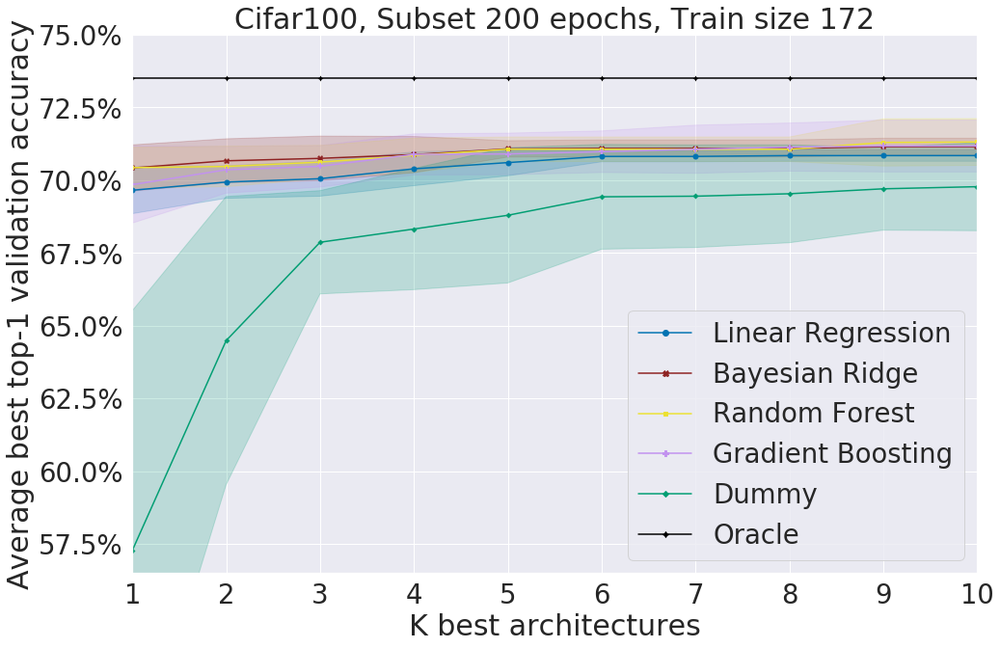

In [64]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole.loc[df_whole['Model'].isin(selected_models)], x="K", y="True_Val_Acc", hue="Model", 
             style="Model", markers=True, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Cifar100, Subset 200 epochs, Train size 172")
ax.set_ylim([56.50, 75.00])
ax.set_xlim([1, 10])
ax.set_ylabel("Average best top-1 validation accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_cifar100_200epochs_n172_k10_top1_val_accs.pdf'), 
            bbox_inches='tight')

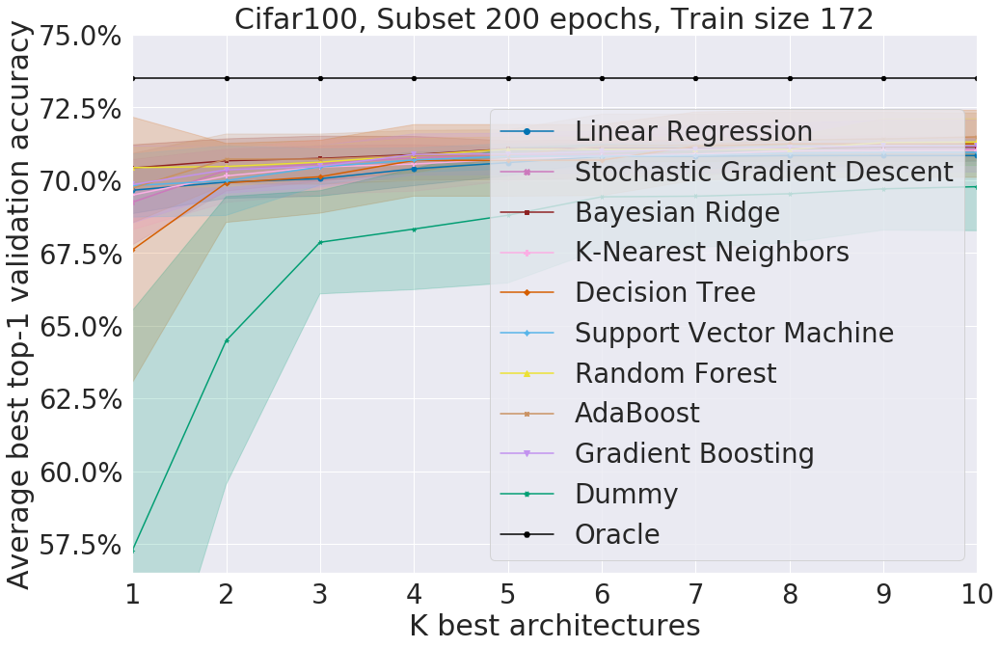

In [65]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole, x="K", y="True_Val_Acc", hue="Model", 
             style="Model", markers=True, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Cifar100, Subset 200 epochs, Train size 172")
ax.set_ylim([56.50, 75.00])
ax.set_xlim([1, 10])
ax.set_ylabel("Average best top-1 validation accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_cifar100_200epochs_n172_k10_top1_val_accs_allmodels.pdf'), 
            bbox_inches='tight')

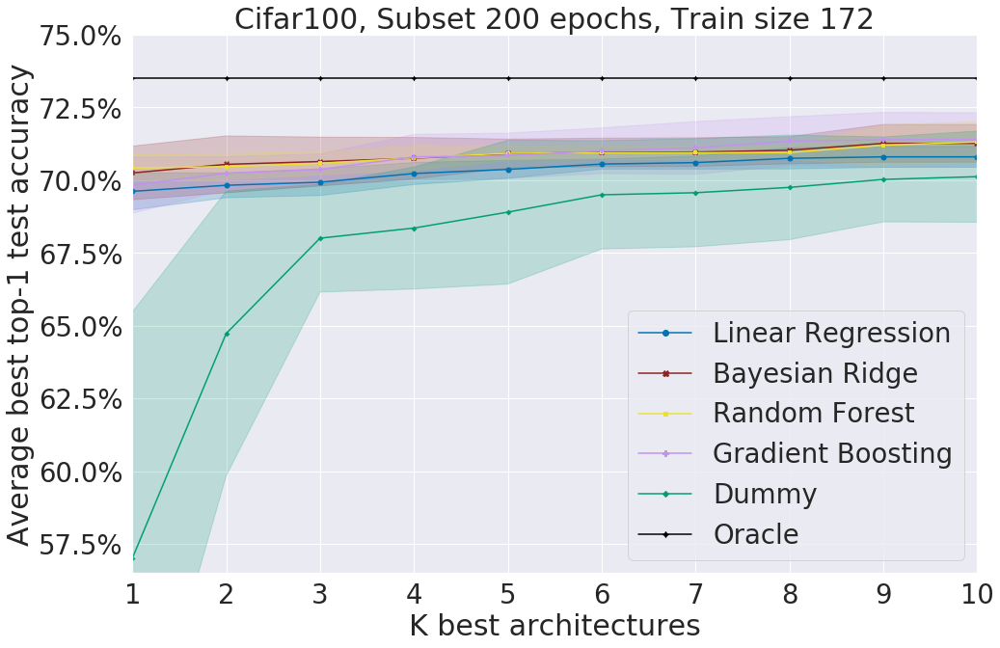

In [66]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole.loc[df_whole['Model'].isin(selected_models)], x="K", y="True_Test_Acc", hue="Model", 
             style="Model", markers=True, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Cifar100, Subset 200 epochs, Train size 172")
ax.set_ylim([56.50, 75.00])
ax.set_xlim([1, 10])
ax.set_ylabel("Average best top-1 test accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_cifar100_200epochs_n172_k10_top1_test_accs.pdf'), 
            bbox_inches='tight')

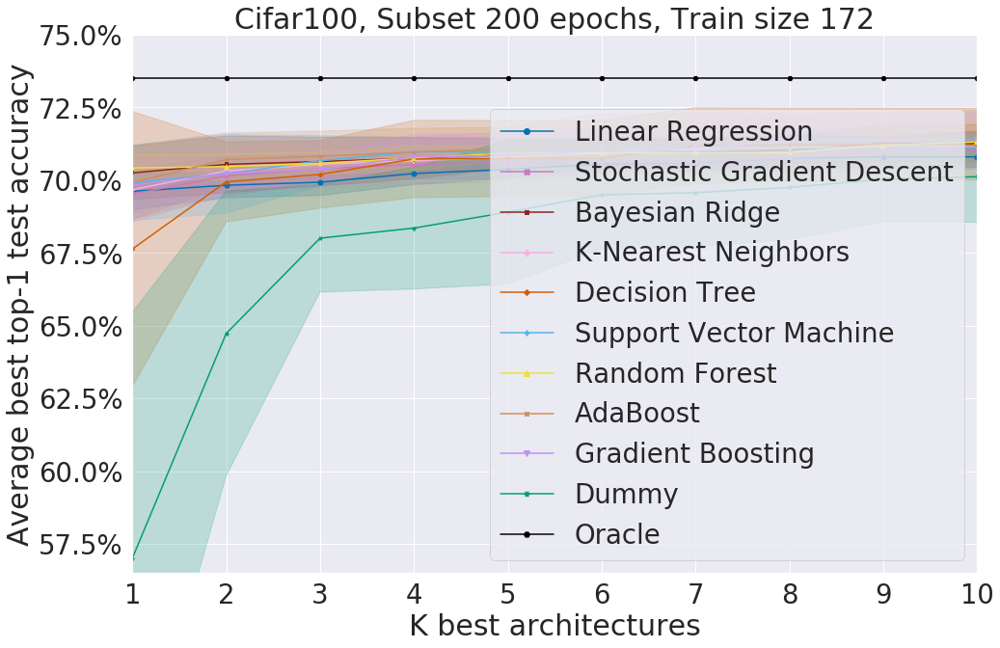

In [67]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole, x="K", y="True_Test_Acc", hue="Model", style="Model", markers=True, palette=palette, 
             markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Cifar100, Subset 200 epochs, Train size 172")
ax.set_ylim([56.50, 75.00])
ax.set_xlim([1, 10])
ax.set_ylabel("Average best top-1 test accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_cifar100_200epochs_n172_k10_top1_test_accs_allmodels.pdf'), 
            bbox_inches='tight')

## Selected Models (K100)

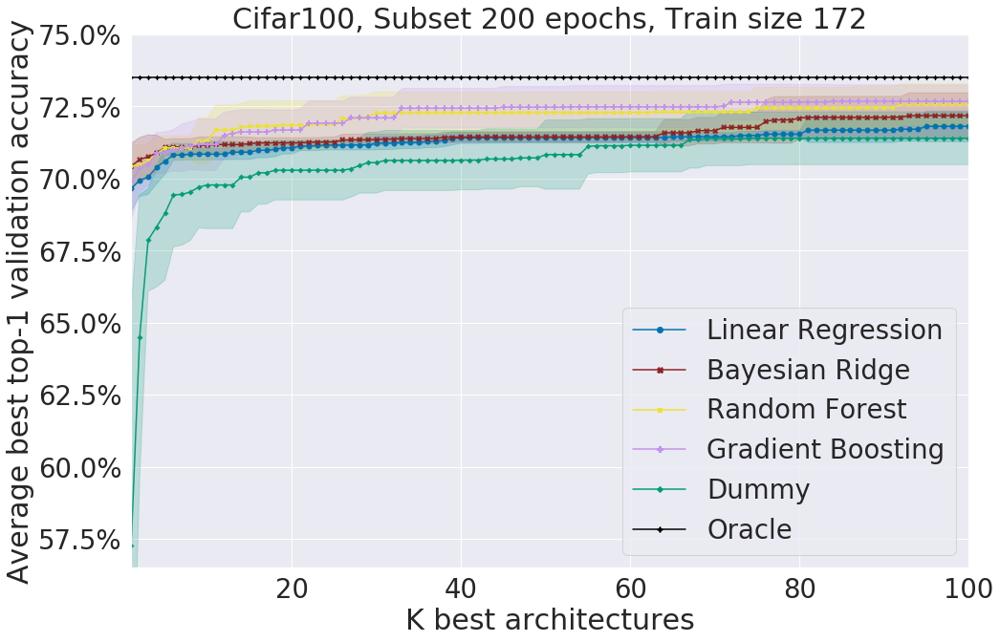

In [68]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole.loc[df_whole['Model'].isin(selected_models)], x="K", y="True_Val_Acc", hue="Model", 
             style="Model", markers=True, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Cifar100, Subset 200 epochs, Train size 172")
ax.set_ylim([56.50, 75.00])
ax.set_xlim([1, 100])
ax.set_ylabel("Average best top-1 validation accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_cifar100_200epochs_n172_k100_top1_val_accs.pdf'), 
            bbox_inches='tight')

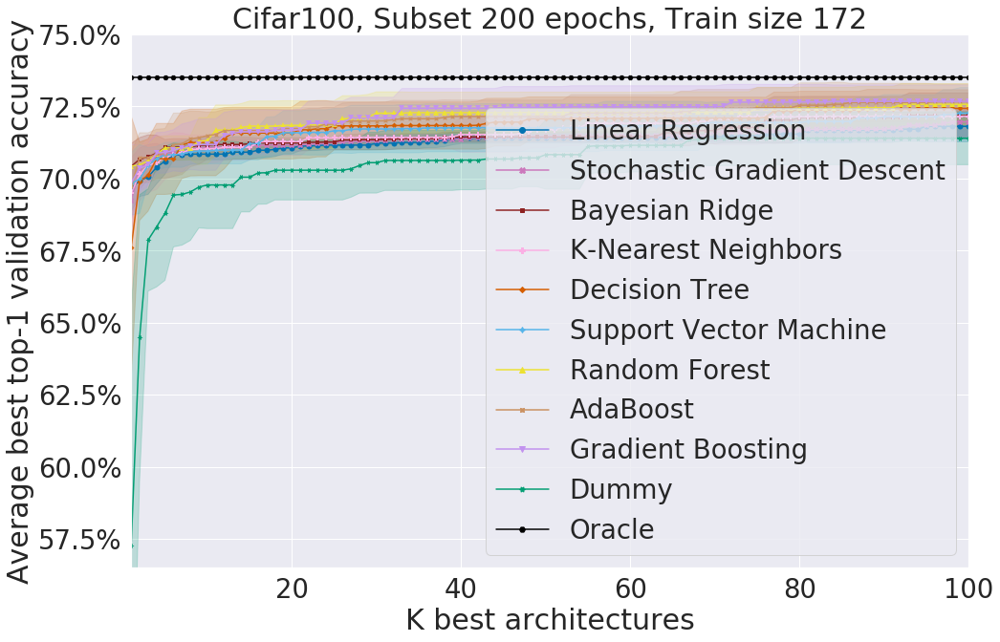

In [69]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole, x="K", y="True_Val_Acc", hue="Model", 
             style="Model", markers=True, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Cifar100, Subset 200 epochs, Train size 172")
ax.set_ylim([56.50, 75.00])
ax.set_xlim([1, 100])
ax.set_ylabel("Average best top-1 validation accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_cifar100_200epochs_n172_k100_top1_val_accs_allmodels.pdf'), 
            bbox_inches='tight')

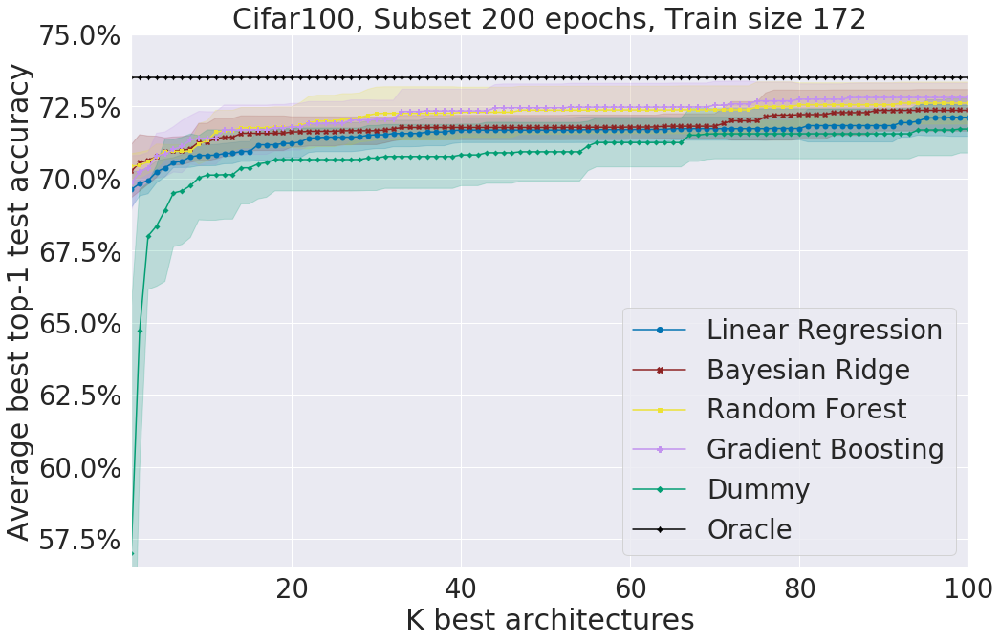

In [70]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole.loc[df_whole['Model'].isin(selected_models)], x="K", y="True_Test_Acc", hue="Model", 
             style="Model", markers=True, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Cifar100, Subset 200 epochs, Train size 172")
ax.set_ylim([56.50, 75.00])
ax.set_xlim([1, 100])
ax.set_ylabel("Average best top-1 test accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_cifar100_200epochs_n172_k100_top1_test_accs.pdf'), 
            bbox_inches='tight')

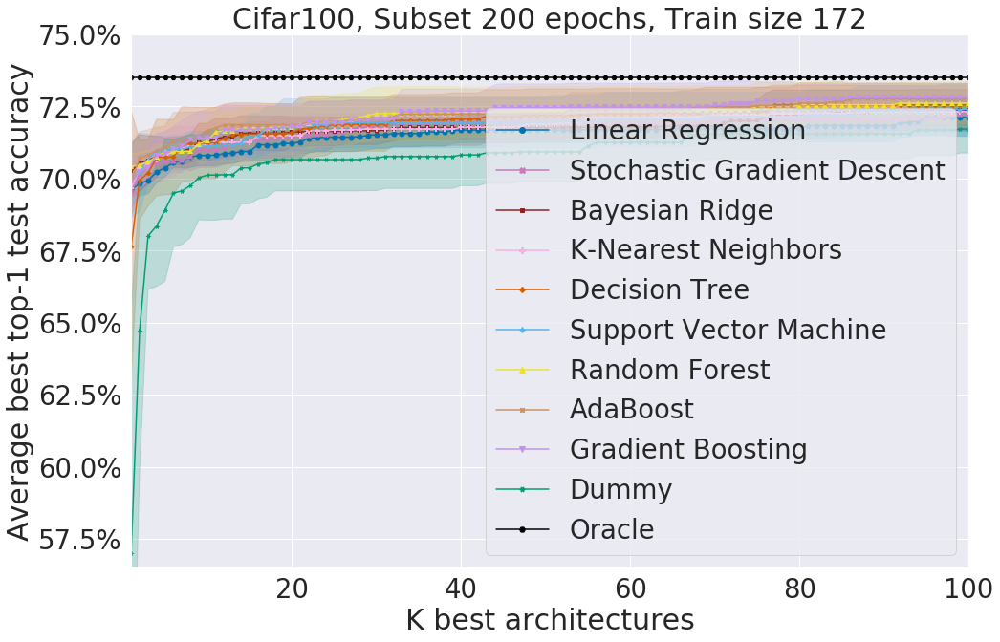

In [71]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole, x="K", y="True_Test_Acc", hue="Model", style="Model", markers=True, palette=palette, 
             markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Cifar100, Subset 200 epochs, Train size 172")
ax.set_ylim([56.50, 75.00])
ax.set_xlim([1, 100])
ax.set_ylabel("Average best top-1 test accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_cifar100_200epochs_n172_k100_top1_test_accs_allmodels.pdf'), 
            bbox_inches='tight')

## Selected Models (K1000) WITHOUT MARKERS

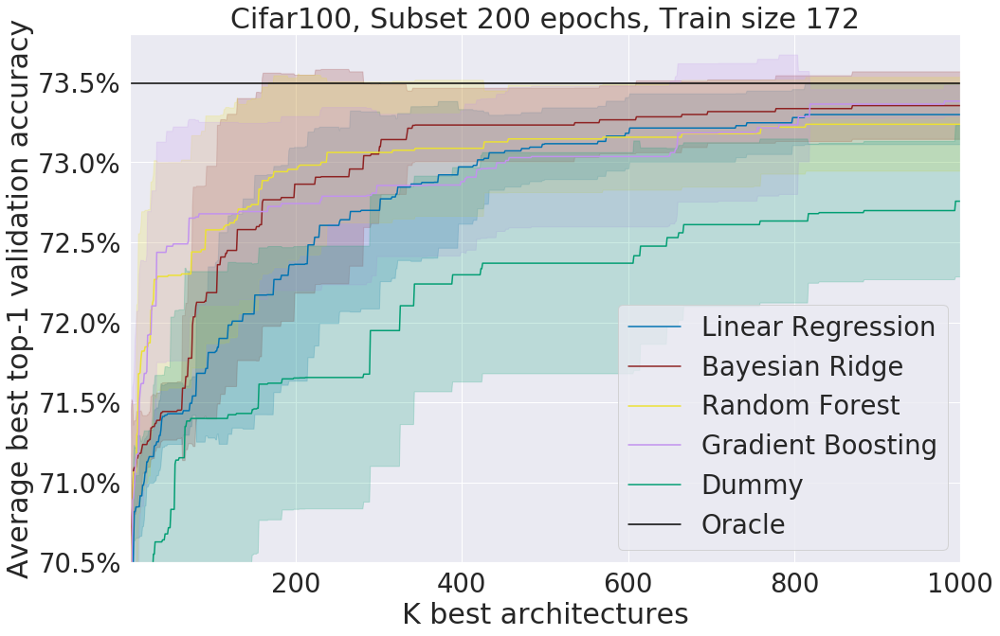

In [72]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole.loc[df_whole['Model'].isin(selected_models)], x="K", y="True_Val_Acc", hue="Model", 
             style="Model", markers=False, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Cifar100, Subset 200 epochs, Train size 172")
ax.set_ylim([70.50, 73.80])
ax.set_xlim([1, 1000])
ax.set_ylabel("Average best top-1 validation accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_cifar100_200epochs_n172_k1000_top1_val_accs.pdf'), 
            bbox_inches='tight')

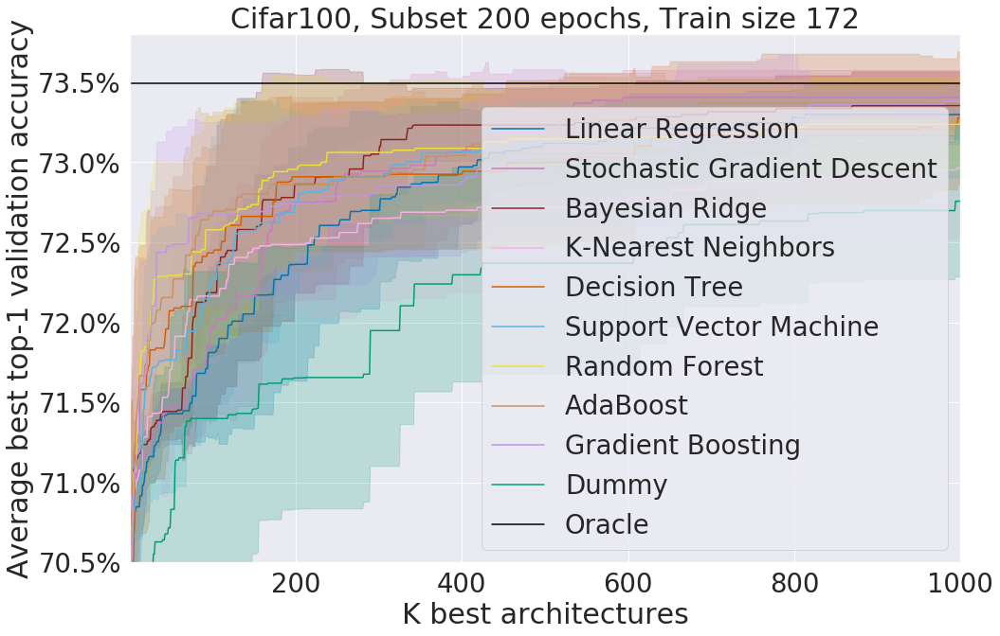

In [73]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole, x="K", y="True_Val_Acc", hue="Model", 
             style="Model", markers=False, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Cifar100, Subset 200 epochs, Train size 172")
ax.set_ylim([70.50, 73.80])
ax.set_xlim([1, 1000])
ax.set_ylabel("Average best top-1 validation accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_cifar100_200epochs_n172_k1000_top1_val_accs_allmodels.pdf'), 
            bbox_inches='tight')

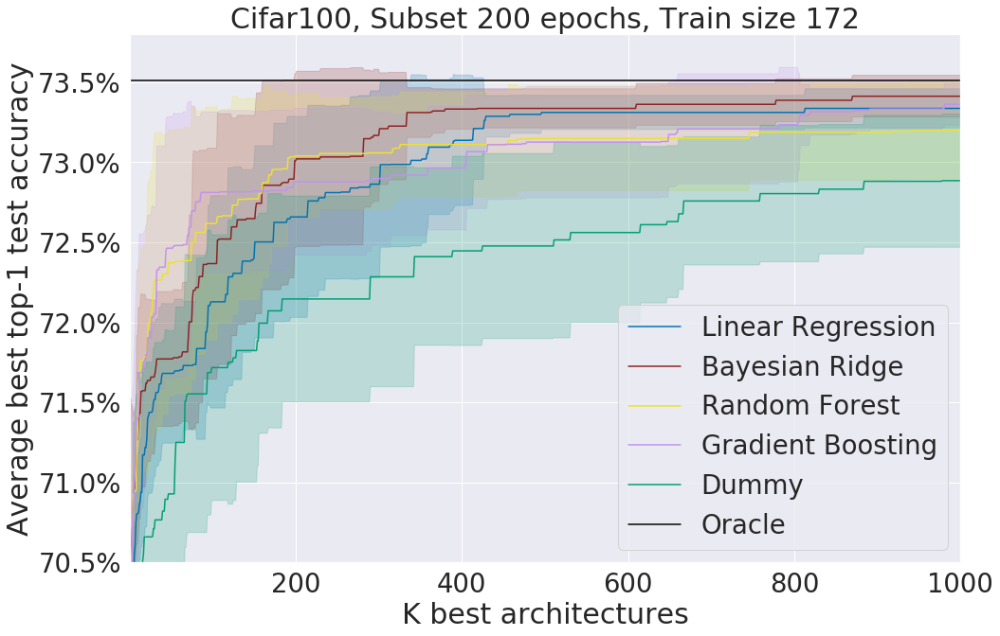

In [74]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole.loc[df_whole['Model'].isin(selected_models)], x="K", y="True_Test_Acc", hue="Model", 
             style="Model", markers=False, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Cifar100, Subset 200 epochs, Train size 172")
ax.set_ylim([70.50, 73.80])
ax.set_xlim([1, 1000])
ax.set_ylabel("Average best top-1 test accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_cifar100_200epochs_n172_k1000_top1_test_accs.pdf'), 
            bbox_inches='tight')

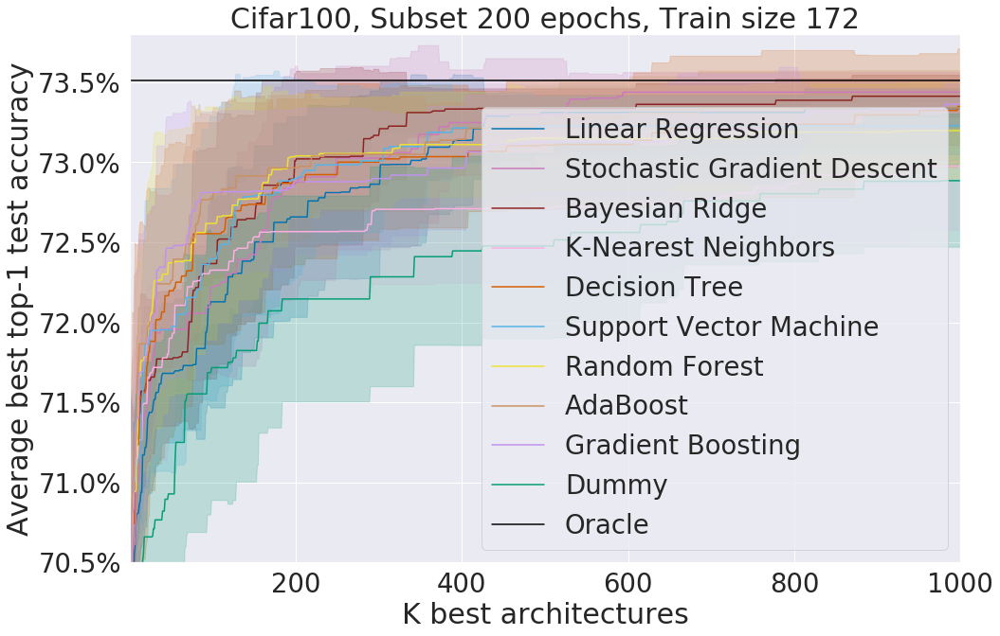

In [75]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole, x="K", y="True_Test_Acc", hue="Model", 
             style="Model", markers=False, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Cifar100, Subset 200 epochs, Train size 172")
ax.set_ylim([70.50, 73.80])
ax.set_xlim([1, 1000])
ax.set_ylabel("Average best top-1 test accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_cifar100_200epochs_n172_k1000_top1_test_accs_allmodels.pdf'), 
            bbox_inches='tight')

## Selected Models (K1000) - Zoom In With Markers

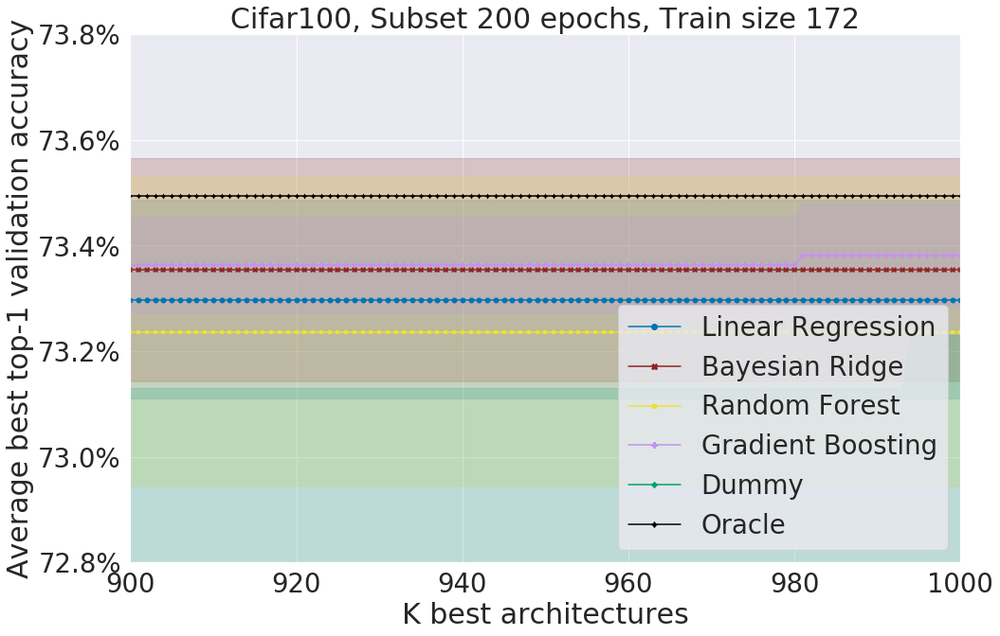

In [76]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole.loc[df_whole['Model'].isin(selected_models)], x="K", y="True_Val_Acc", hue="Model", 
             style="Model", markers=True, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Cifar100, Subset 200 epochs, Train size 172")
ax.set_ylim([72.80, 73.80])
ax.set_xlim([900, 1000])
ax.set_ylabel("Average best top-1 validation accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_cifar100_200epochs_n172_k1000_top1_val_accs_zoom.pdf'), 
            bbox_inches='tight')

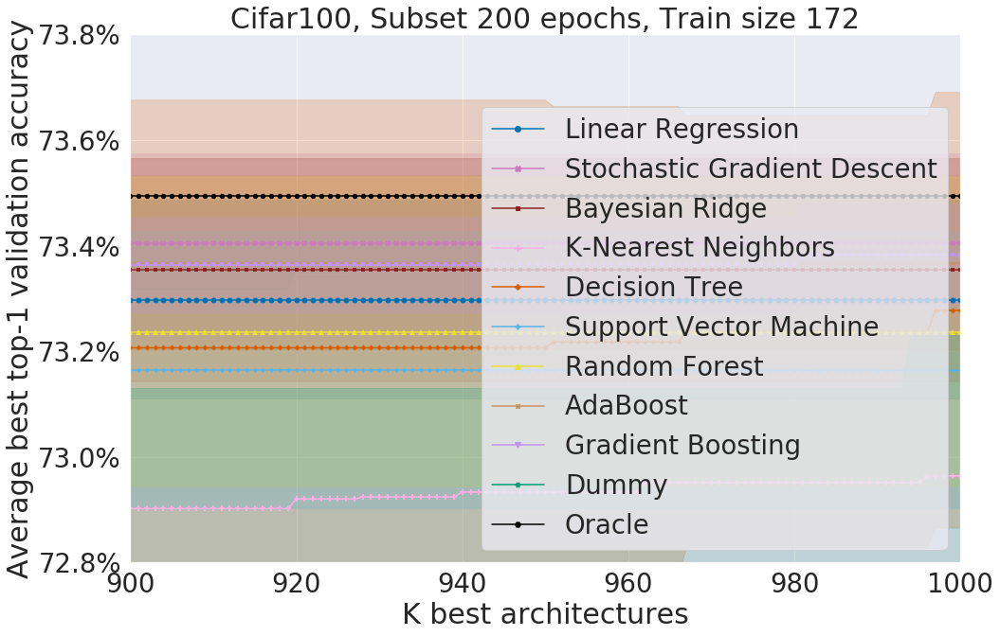

In [77]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole, x="K", y="True_Val_Acc", hue="Model", 
             style="Model", markers=True, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Cifar100, Subset 200 epochs, Train size 172")
ax.set_ylim([72.80, 73.80])
ax.set_xlim([900, 1000])
ax.set_ylabel("Average best top-1 validation accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_cifar100_200epochs_n172_k1000_top1_val_accs_zoom_allmodels.pdf'), 
            bbox_inches='tight')

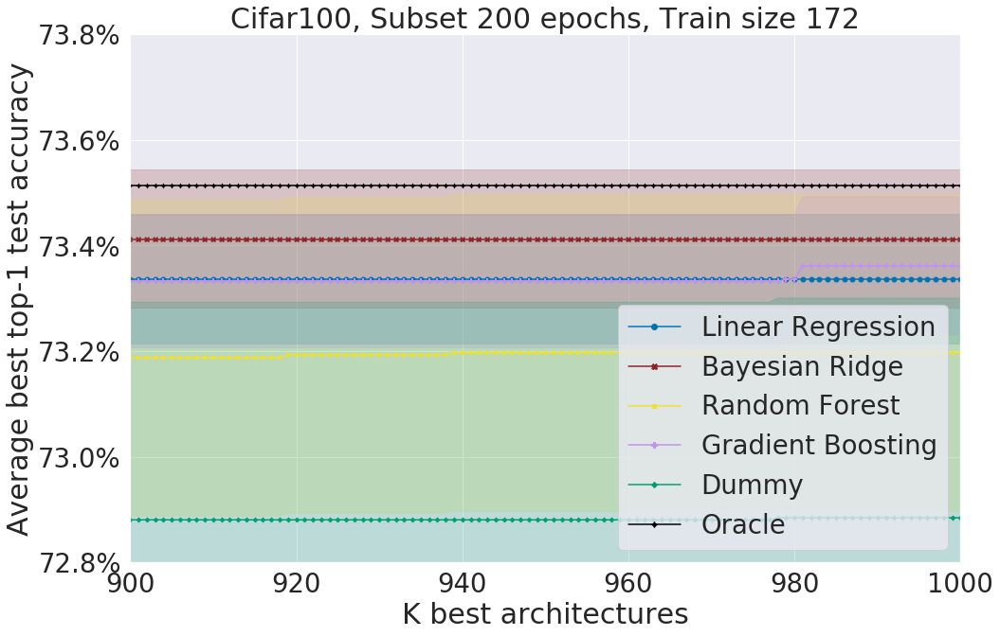

In [78]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole.loc[df_whole['Model'].isin(selected_models)], x="K", y="True_Test_Acc", hue="Model", 
             style="Model", markers=True, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Cifar100, Subset 200 epochs, Train size 172")
ax.set_ylim([72.80, 73.80])
ax.set_xlim([900, 1000])
ax.set_ylabel("Average best top-1 test accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_cifar100_200epochs_n172_k1000_top1_test_accs_zoom.pdf'), 
            bbox_inches='tight')

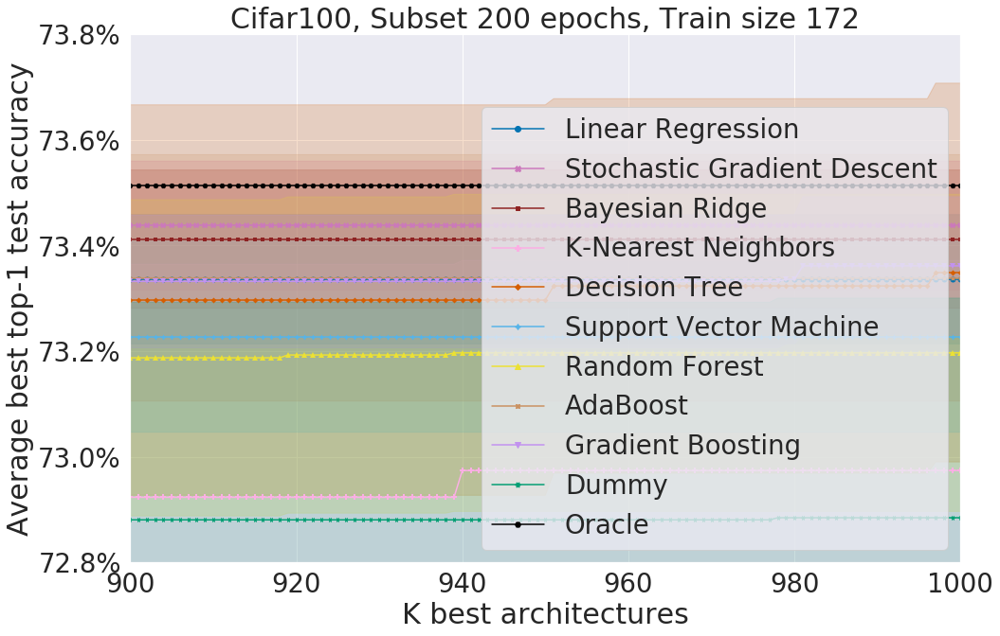

In [79]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole, x="K", y="True_Test_Acc", hue="Model", 
             style="Model", markers=True, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Cifar100, Subset 200 epochs, Train size 172")
ax.set_ylim([72.80, 73.80])
ax.set_xlim([900, 1000])
ax.set_ylabel("Average best top-1 test accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_cifar100_200epochs_n172_k1000_top1_test_accs_zoom_allmodels.pdf'), 
            bbox_inches='tight')

# Imagenet16-120

# Subset 200

In [80]:
df_oracle = pd.read_csv("/home/gean/nns_performance_prediction/results/oracle/nasbench201_imagenet16_120_200epochs_k5000_oracle.csv")
df_oracle

,Dataset,Epoch,Model,K,True_Val_Acc,True_Test_Acc,Best_Test_Acc
0,imagenet16_120,200,Oracle,1,46.733333,46.2,47.311111
1,imagenet16_120,200,Oracle,2,46.733333,46.2,47.311111
2,imagenet16_120,200,Oracle,3,46.733333,46.2,47.311111
3,imagenet16_120,200,Oracle,4,46.733333,46.2,47.311111
4,imagenet16_120,200,Oracle,5,46.733333,46.2,47.311111
...,...,...,...,...,...,...,...
4995,imagenet16_120,200,Oracle,4996,46.733333,46.2,47.311111
4996,imagenet16_120,200,Oracle,4997,46.733333,46.2,47.311111
4997,imagenet16_120,200,Oracle,4998,46.733333,46.2,47.311111
4998,imagenet16_120,200,Oracle,4999,46.733333,46.2,47.311111


In [81]:
df_whole = pd.read_csv("/home/gean/nns_performance_prediction/results/fast/test12/nasbench201_imagenet16_120_200epochs_n172_k5000_top1_val_test_accs.csv")
df_whole

,Dataset,Epoch,Train_Size,Seed,Model,K,True_Val_Acc,True_Test_Acc
0,imagenet16_120,200,172,0,LinearRegression,1,44.400000,45.166667
1,imagenet16_120,200,172,0,LinearRegression,2,44.400000,45.166667
2,imagenet16_120,200,172,0,LinearRegression,3,44.400000,45.166667
3,imagenet16_120,200,172,0,LinearRegression,4,45.116667,45.700000
4,imagenet16_120,200,172,0,LinearRegression,5,45.116667,45.700000
...,...,...,...,...,...,...,...,...
549995,imagenet16_120,200,172,12345,DummyRegressor,4996,46.733333,47.311111
549996,imagenet16_120,200,172,12345,DummyRegressor,4997,46.733333,47.311111
549997,imagenet16_120,200,172,12345,DummyRegressor,4998,46.733333,47.311111
549998,imagenet16_120,200,172,12345,DummyRegressor,4999,46.733333,47.311111


In [82]:
df_whole = df_whole.loc[df_whole['Model'] != 'Lasso']

In [83]:
df_whole = df_whole.append(df_oracle)

df_whole['Model'].replace({'LinearRegression': 'Linear Regression', 
                           'DecisionTreeRegressor': 'Decision Tree', 'SGDRegressor': 'Stochastic Gradient Descent', 
                           'MLPRegressor': 'Feedforward Neural Network', 'BayesianRidge': 'Bayesian Ridge',
                           'KNeighborsRegressor': 'K-Nearest Neighbors', 'SVR': 'Support Vector Machine',
                           'AdaBoostRegressor': 'AdaBoost', 'GradientBoostingRegressor': 'Gradient Boosting',
                           'RandomForestRegressor': 'Random Forest', 'DummyRegressor': 'Dummy',  
                           'GCN_Complete': 'Graph Convolutional Network'}, inplace=True)
df_whole

,Dataset,Epoch,Train_Size,Seed,Model,K,True_Val_Acc,True_Test_Acc,Best_Test_Acc
0,imagenet16_120,200,172.0,0.0,Linear Regression,1,44.400000,45.166667,NaN
1,imagenet16_120,200,172.0,0.0,Linear Regression,2,44.400000,45.166667,NaN
2,imagenet16_120,200,172.0,0.0,Linear Regression,3,44.400000,45.166667,NaN
3,imagenet16_120,200,172.0,0.0,Linear Regression,4,45.116667,45.700000,NaN
4,imagenet16_120,200,172.0,0.0,Linear Regression,5,45.116667,45.700000,NaN
...,...,...,...,...,...,...,...,...,...
4995,imagenet16_120,200,NaN,NaN,Oracle,4996,46.733333,46.200000,47.311111
4996,imagenet16_120,200,NaN,NaN,Oracle,4997,46.733333,46.200000,47.311111
4997,imagenet16_120,200,NaN,NaN,Oracle,4998,46.733333,46.200000,47.311111
4998,imagenet16_120,200,NaN,NaN,Oracle,4999,46.733333,46.200000,47.311111


## Selected Models (K10)

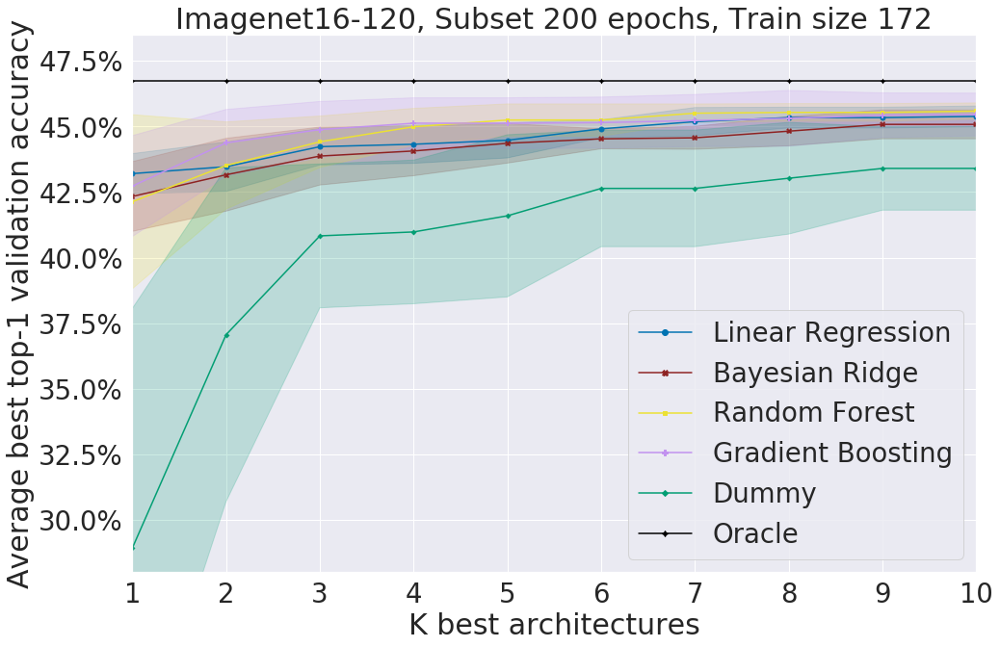

In [84]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole.loc[df_whole['Model'].isin(selected_models)], x="K", y="True_Val_Acc", hue="Model", 
             style="Model", markers=True, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Imagenet16-120, Subset 200 epochs, Train size 172")
ax.set_ylim([28.00, 48.50])
ax.set_xlim([1, 10])
ax.set_ylabel("Average best top-1 validation accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_imagenet16_120_200epochs_n172_k10_top1_val_accs.pdf'), 
            bbox_inches='tight')

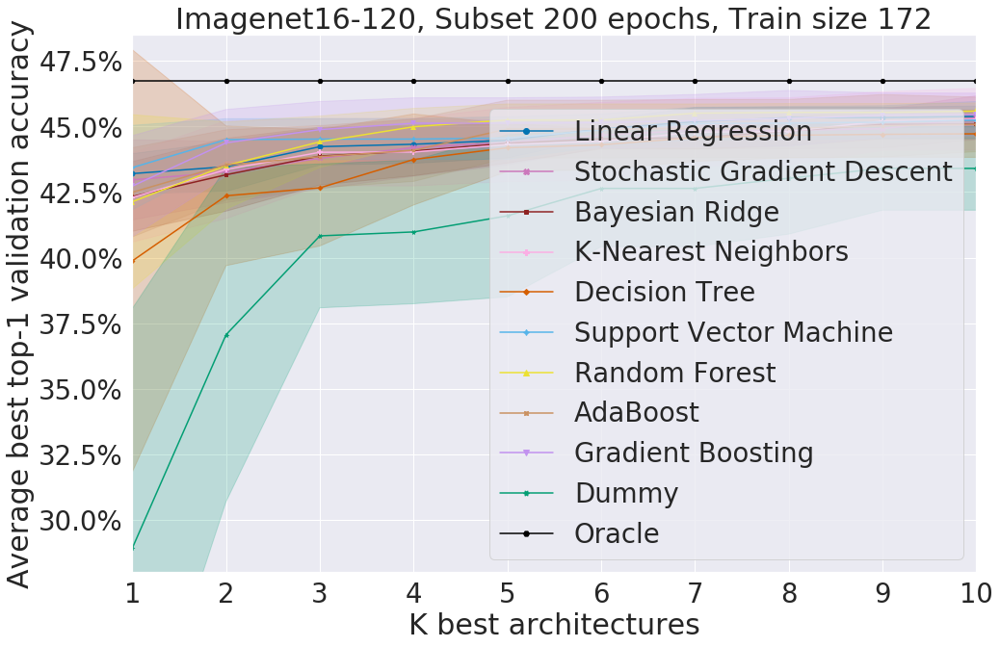

In [85]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole, x="K", y="True_Val_Acc", hue="Model", 
             style="Model", markers=True, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Imagenet16-120, Subset 200 epochs, Train size 172")
ax.set_ylim([28.00, 48.50])
ax.set_xlim([1, 10])
ax.set_ylabel("Average best top-1 validation accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_imagenet16_120_200epochs_n172_k10_top1_val_accs_allmodels.pdf'), 
            bbox_inches='tight')

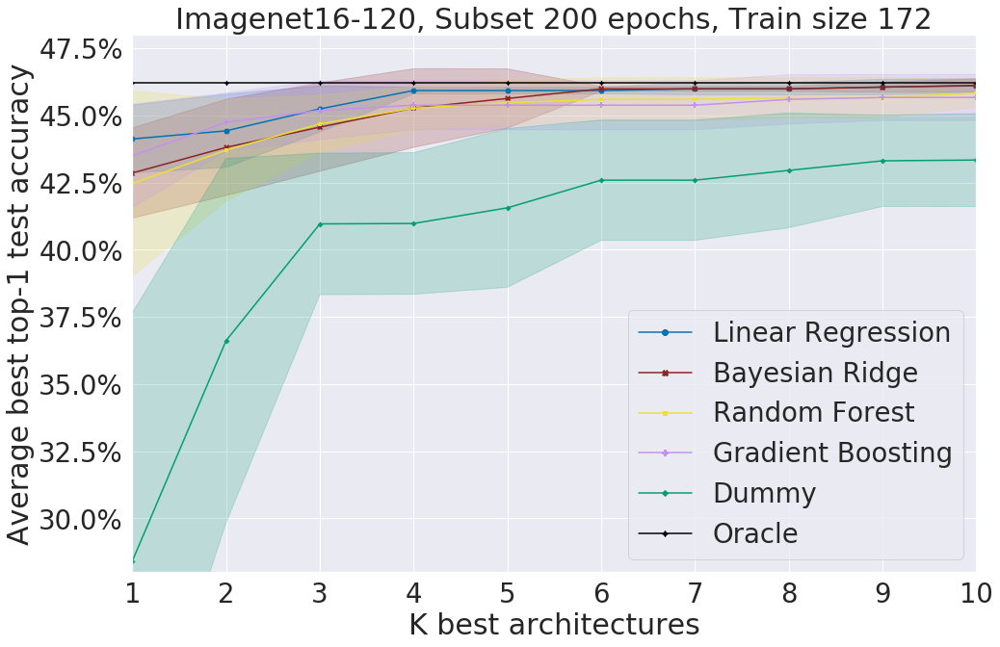

In [86]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole.loc[df_whole['Model'].isin(selected_models)], x="K", y="True_Test_Acc", hue="Model", 
             style="Model", markers=True, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Imagenet16-120, Subset 200 epochs, Train size 172")
ax.set_ylim([28.00, 48.00])
ax.set_xlim([1, 10])
ax.set_ylabel("Average best top-1 test accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_imagenet16_120_200epochs_n172_k10_top1_test_accs.pdf'), 
            bbox_inches='tight')

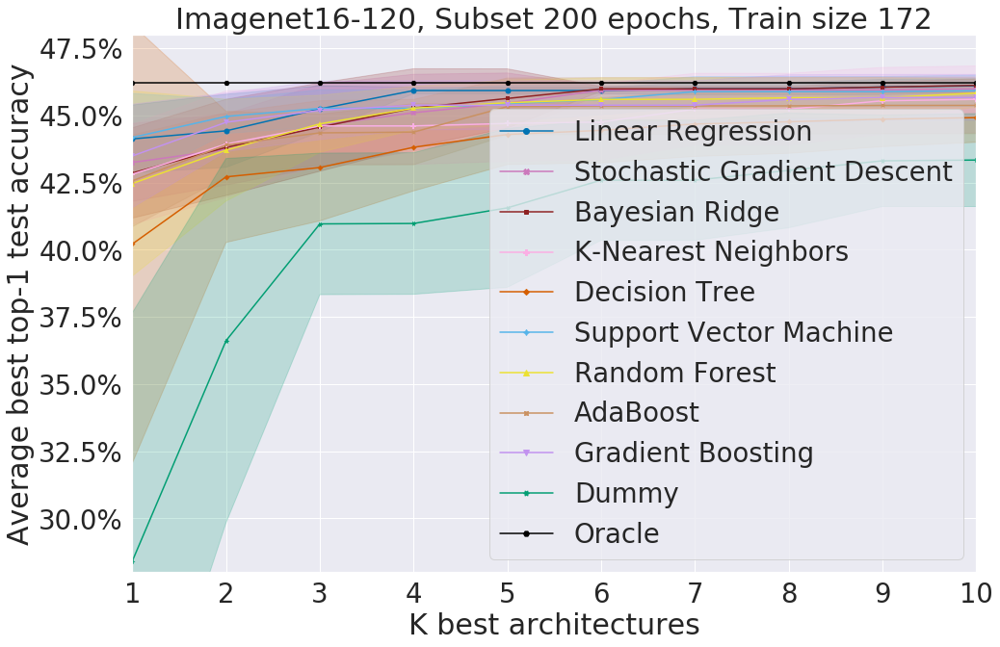

In [87]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole, x="K", y="True_Test_Acc", hue="Model", style="Model", markers=True, palette=palette, 
             markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Imagenet16-120, Subset 200 epochs, Train size 172")
ax.set_ylim([28.00, 48.00])
ax.set_xlim([1, 10])
ax.set_ylabel("Average best top-1 test accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_imagenet16_120_200epochs_n172_k10_top1_test_accs_allmodels.pdf'), 
            bbox_inches='tight')

## Selected Models (K100)

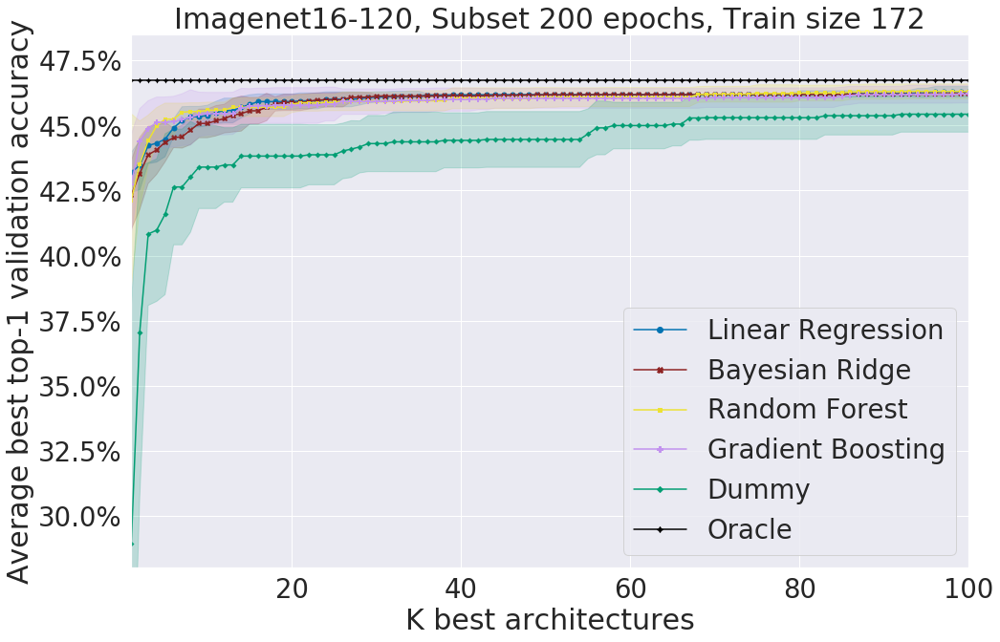

In [88]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole.loc[df_whole['Model'].isin(selected_models)], x="K", y="True_Val_Acc", hue="Model", 
             style="Model", markers=True, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Imagenet16-120, Subset 200 epochs, Train size 172")
ax.set_ylim([28.00, 48.50])
ax.set_xlim([1, 100])
ax.set_ylabel("Average best top-1 validation accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_imagenet16_120_200epochs_n172_k100_top1_val_accs.pdf'), 
            bbox_inches='tight')

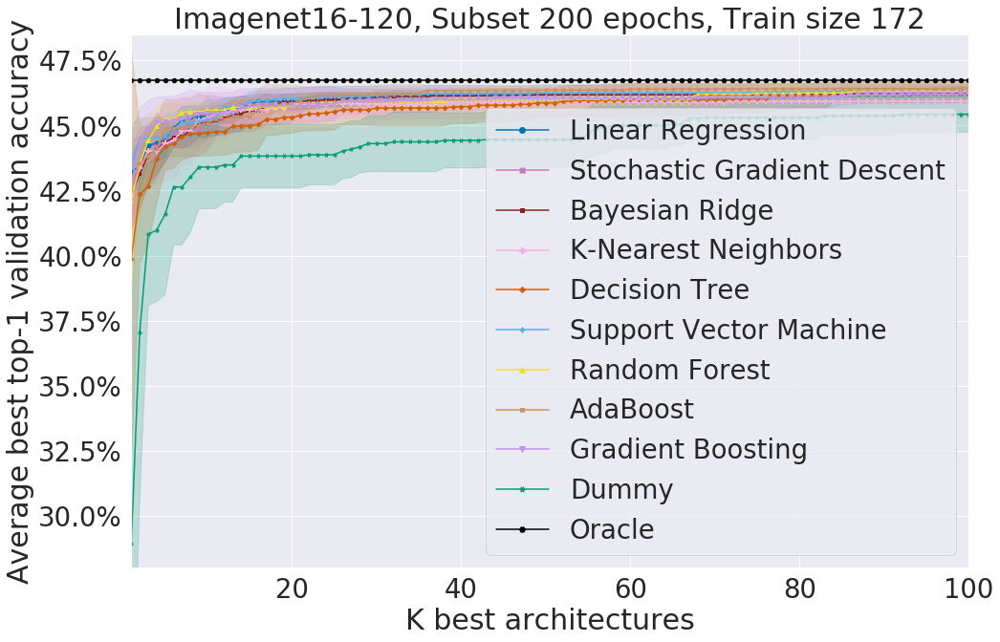

In [89]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole, x="K", y="True_Val_Acc", hue="Model", 
             style="Model", markers=True, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Imagenet16-120, Subset 200 epochs, Train size 172")
ax.set_ylim([28.00, 48.50])
ax.set_xlim([1, 100])
ax.set_ylabel("Average best top-1 validation accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_imagenet16_120_200epochs_n172_k100_top1_val_accs_allmodels.pdf'), 
            bbox_inches='tight')

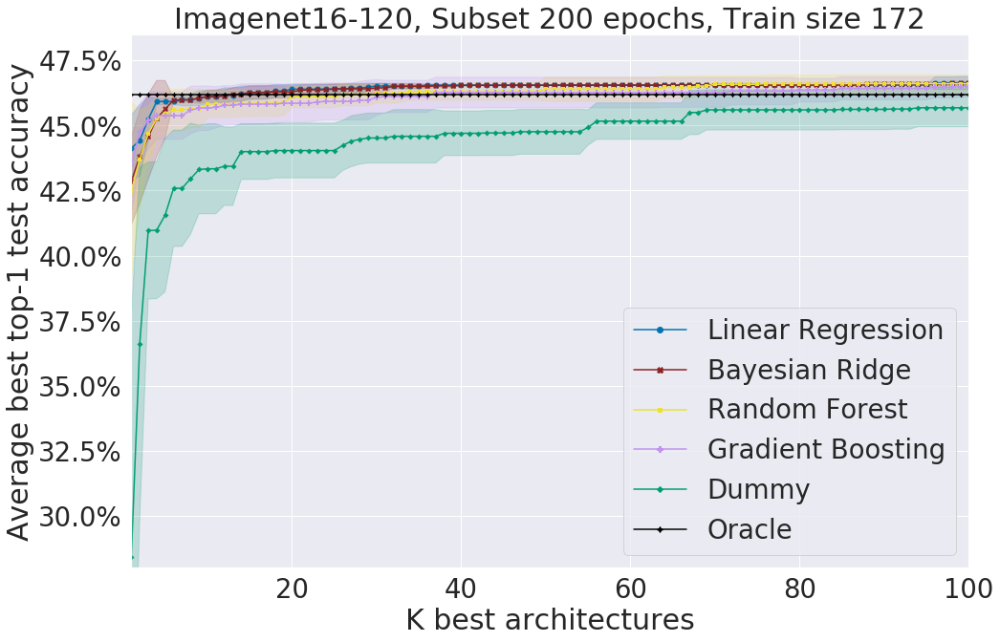

In [90]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole.loc[df_whole['Model'].isin(selected_models)], x="K", y="True_Test_Acc", hue="Model", 
             style="Model", markers=True, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Imagenet16-120, Subset 200 epochs, Train size 172")
ax.set_ylim([28.00, 48.50])
ax.set_xlim([1, 100])
ax.set_ylabel("Average best top-1 test accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_imagenet16_120_200epochs_n172_k100_top1_test_accs.pdf'), 
            bbox_inches='tight')

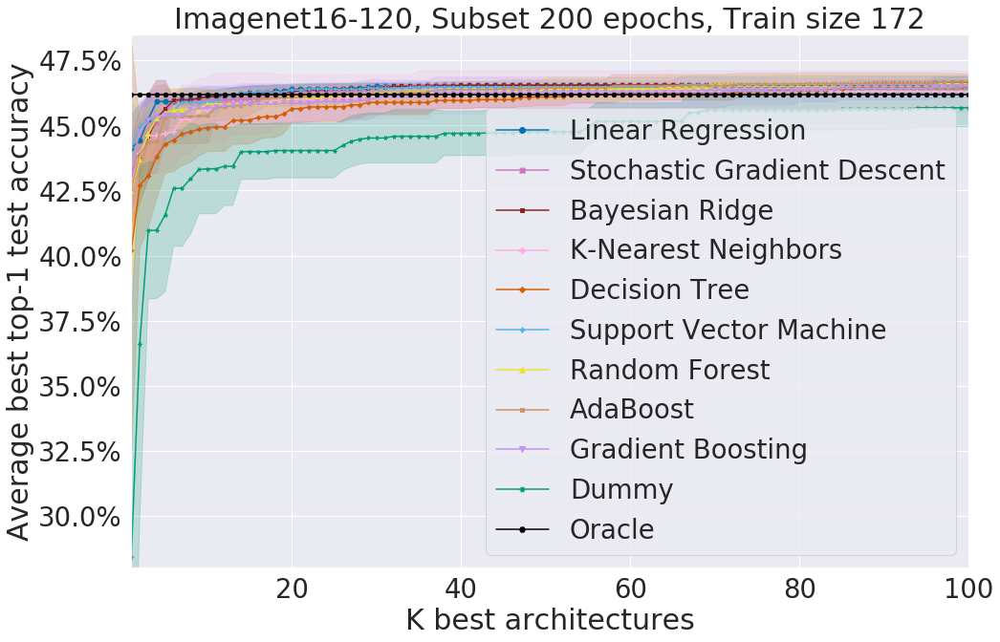

In [91]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole, x="K", y="True_Test_Acc", hue="Model", style="Model", markers=True, palette=palette, 
             markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Imagenet16-120, Subset 200 epochs, Train size 172")
ax.set_ylim([28.00, 48.50])
ax.set_xlim([1, 100])
ax.set_ylabel("Average best top-1 test accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_imagenet16_120_200epochs_n172_k100_top1_test_accs_allmodels.pdf'), 
            bbox_inches='tight')

## Selected Models (K1000) WITHOUT MARKERS

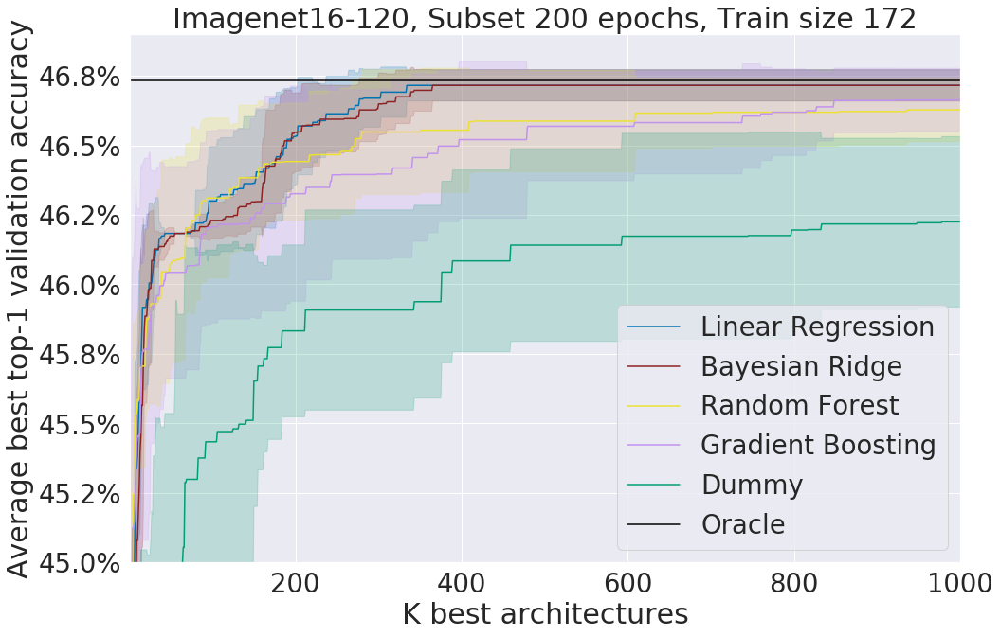

In [92]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole.loc[df_whole['Model'].isin(selected_models)], x="K", y="True_Val_Acc", hue="Model", 
             style="Model", markers=False, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Imagenet16-120, Subset 200 epochs, Train size 172")
ax.set_ylim([45.00, 46.90])
ax.set_xlim([1, 1000])
ax.set_ylabel("Average best top-1 validation accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_imagenet16_120_200epochs_n172_k1000_top1_val_accs.pdf'), 
            bbox_inches='tight')

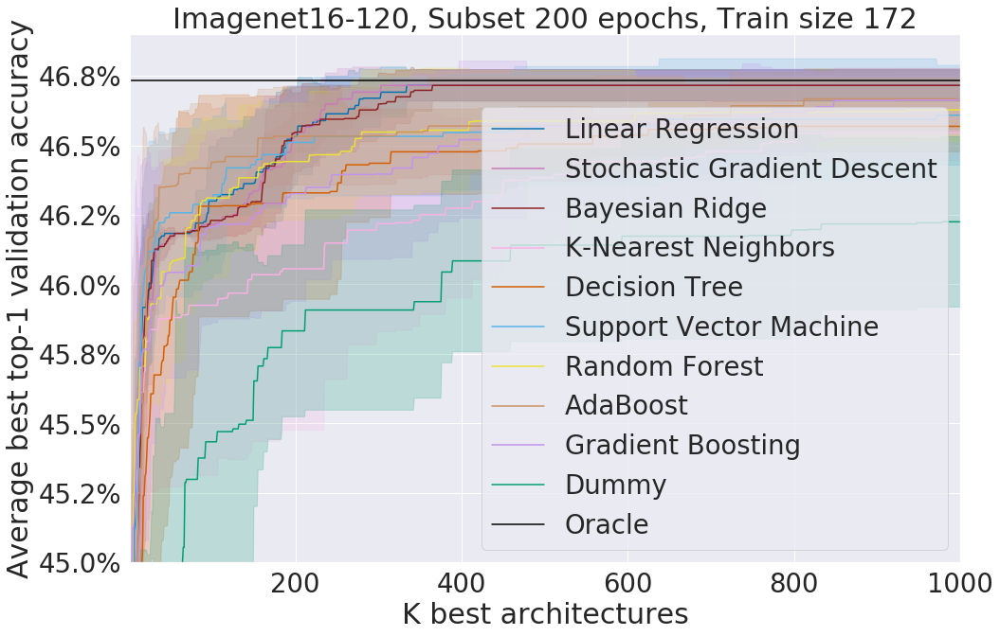

In [93]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole, x="K", y="True_Val_Acc", hue="Model", 
             style="Model", markers=False, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Imagenet16-120, Subset 200 epochs, Train size 172")
ax.set_ylim([45.00, 46.90])
ax.set_xlim([1, 1000])
ax.set_ylabel("Average best top-1 validation accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_imagenet16_120_200epochs_n172_k1000_top1_val_accs_allmodels.pdf'), 
            bbox_inches='tight')

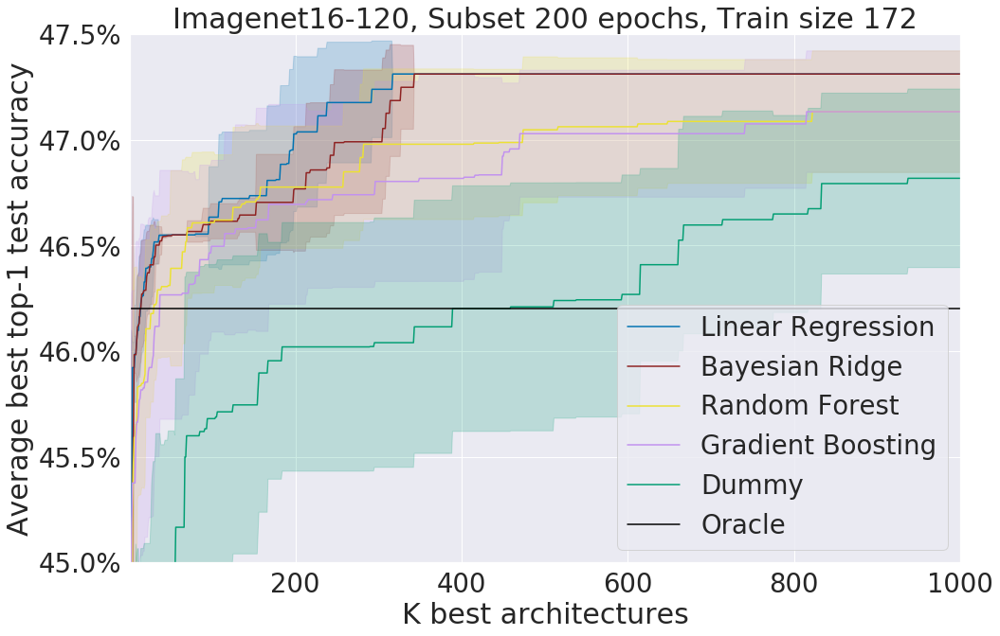

In [94]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole.loc[df_whole['Model'].isin(selected_models)], x="K", y="True_Test_Acc", hue="Model", 
             style="Model", markers=False, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Imagenet16-120, Subset 200 epochs, Train size 172")
ax.set_ylim([45.00, 47.50])
ax.set_xlim([1, 1000])
ax.set_ylabel("Average best top-1 test accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_imagenet16_120_200epochs_n172_k1000_top1_test_accs.pdf'), 
            bbox_inches='tight')

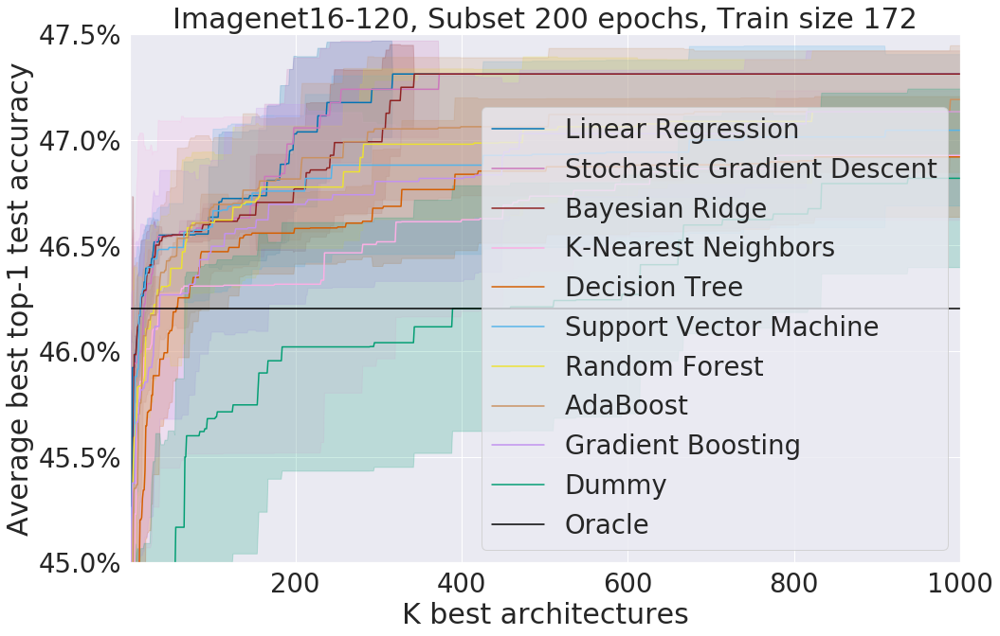

In [95]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole, x="K", y="True_Test_Acc", hue="Model", rasterized=True,
             style="Model", markers=False, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Imagenet16-120, Subset 200 epochs, Train size 172")
ax.set_ylim([45.00, 47.50])
ax.set_xlim([1, 1000])
ax.set_ylabel("Average best top-1 test accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_imagenet16_120_200epochs_n172_k1000_top1_test_accs_allmodels.pdf'), 
            bbox_inches='tight')

## Selected Models (K1000) - Zoom In With Markers

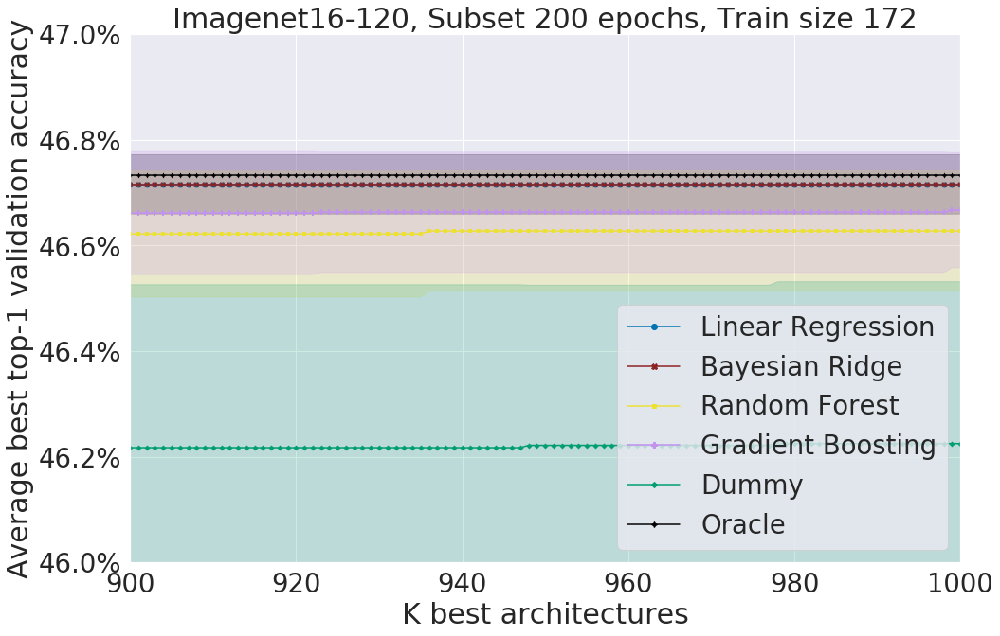

In [96]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole.loc[df_whole['Model'].isin(selected_models)], x="K", y="True_Val_Acc", hue="Model", 
             style="Model", markers=True, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Imagenet16-120, Subset 200 epochs, Train size 172")
ax.set_ylim([46.00, 47.00])
ax.set_xlim([900, 1000])
ax.set_ylabel("Average best top-1 validation accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_imagenet16_120_200epochs_n172_k1000_top1_val_accs_zoom.pdf'), 
            bbox_inches='tight')

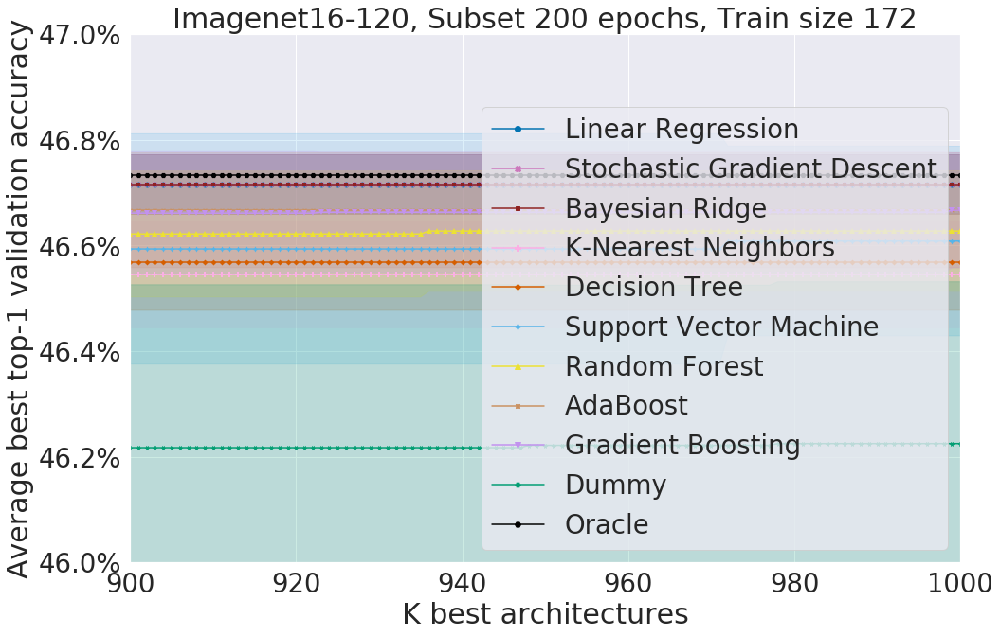

In [97]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole, x="K", y="True_Val_Acc", hue="Model", 
             style="Model", markers=True, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Imagenet16-120, Subset 200 epochs, Train size 172")
ax.set_ylim([46.00, 47.00])
ax.set_xlim([900, 1000])
ax.set_ylabel("Average best top-1 validation accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_imagenet16_120_200epochs_n172_k1000_top1_val_accs_zoom_allmodels.pdf'), 
            bbox_inches='tight')

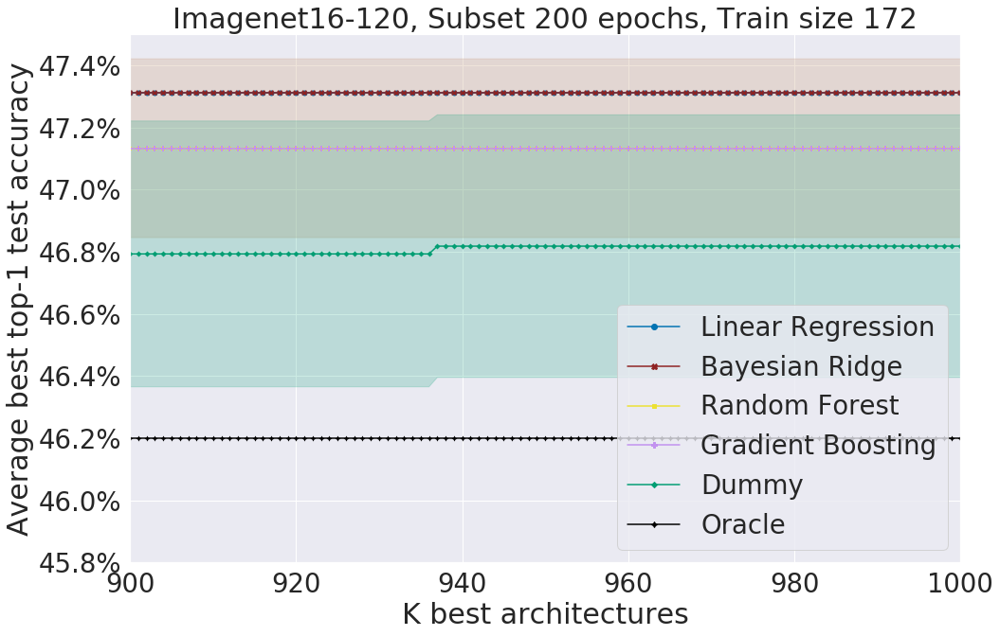

In [98]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole.loc[df_whole['Model'].isin(selected_models)], x="K", y="True_Test_Acc", hue="Model", 
             style="Model", markers=True, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Imagenet16-120, Subset 200 epochs, Train size 172")
ax.set_ylim([45.80, 47.50])
ax.set_xlim([900, 1000])
ax.set_ylabel("Average best top-1 test accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_imagenet16_120_200epochs_n172_k1000_top1_test_accs_zoom.pdf'), 
            bbox_inches='tight')

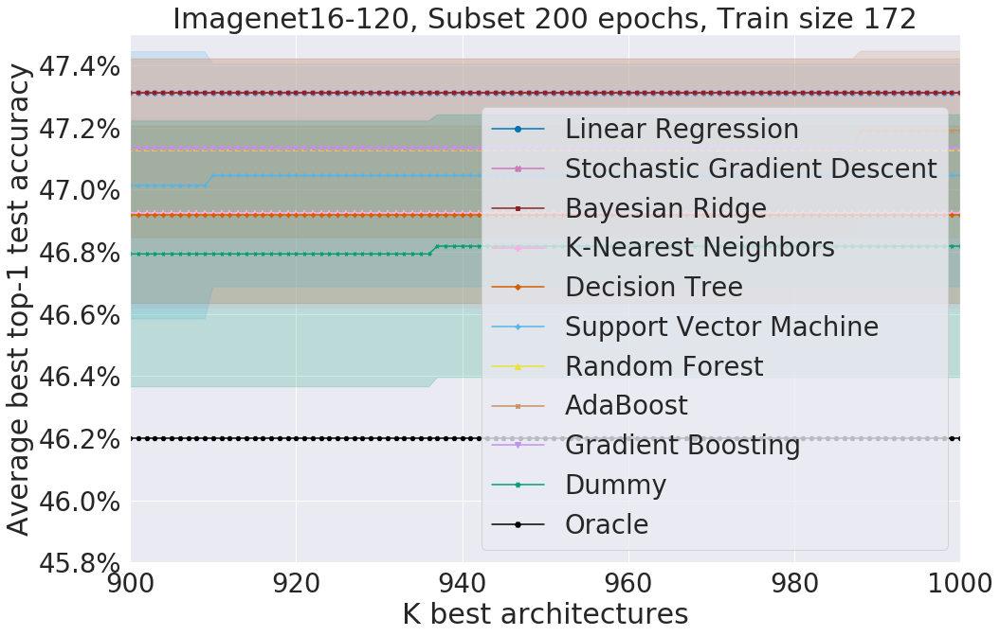

In [99]:
fig, ax = plt.subplots()
sns.lineplot(data=df_whole, x="K", y="True_Test_Acc", hue="Model", 
             style="Model", markers=True, palette=palette, markeredgewidth=0, dashes=False, ci="sd", ax=ax)

ax.set_title("Imagenet16-120, Subset 200 epochs, Train size 172")
ax.set_ylim([45.80, 47.50])
ax.set_xlim([900, 1000])
ax.set_ylabel("Average best top-1 test accuracy")
ax.set_xlabel("K best architectures")
ax.legend(loc='lower right')

ylabels = ["{:.1f}%".format(y) for y in ax.get_yticks()]
ax.set_yticklabels(ylabels)

plt.savefig(str('/home/gean/nns_performance_prediction/results/fast/test12/' + 
                'nasbench201_imagenet16_120_200epochs_n172_k1000_top1_test_accs_zoom_allmodels.pdf'), 
            bbox_inches='tight')